# CHAPTER 1: DEFINITION OF THE PROBLEM STATEMENT AND EXPLORATORY DATA ANALYSIS

## INTRODUCTION TO `LOAN TAP`

> `LoanTap` is a Fintech company (RBI registered NBFC) committted to deliver flexible loan products to salaried professionals. It offers innovative loans to help millennials achieve a life that they desire. In the midst of a crowded `Personal Loan Segment`, The fastest Personal loans are delivered by `LoanTap` at customer friendly terms.

> LoanTap deploys formal credit to salaried individuals and businesses in four different financial ways:

    1. Personal Loan
    2. EMI Free Loan
    3. Personal Overdraft
    4. Advance Salary Loan

## DEFINITION OF PROBLEM

> The data science team at LoanTap is building an underwriting layer to determine the creditworthiness of MSMEs as well as individuals

> Given a set of attributes for an individual, The case study determines if a credit line should be extended to them. if so, what should the repayment terms be in business recommendations

**TRADE OFF QUESTIONS:**

> How can we make sure that our model can detect real defaulters and there are less false positives? (This is important as we can lose out on an oppurtunity to finance more individuals and earn interest on it)

> Since NPA (non performing asset) is real problem in this industry, It's important we play safe and shouldn't disburse loans to anyone

## IMPORTING THE LIBRARIES AND DATASET

### Importing all the required libraries

In [454]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations,permutations
from pandas.api.types import is_datetime64_any_dtype
import math
import warnings
from sklearn.impute import SimpleImputer,KNNImputer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,log_loss,f1_score,recall_score,precision_score,roc_auc_score,matthews_corrcoef
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
from scipy import stats
from sklearn.pipeline import make_pipeline
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import fbeta_score
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import auc
from sklearn.metrics import classification_report

### Importing the Dataset

In [520]:
LoanTap = pd.read_csv("LoanTapData.csv")

In [57]:
# Changing the pandas option to display all columns of table
pd.set_option('display.max_columns',None)

In [58]:
# top 10 rows of the dataset 
LoanTap.head(10)

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,dti,earliest_cr_line,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address
0,10000.0,36 months,11.44,329.48,B,B4,Marketing,10+ years,RENT,117000.0,Not Verified,Jan-2015,Fully Paid,vacation,Vacation,26.24,Jun-1990,16.0,0.0,36369.0,41.8,25.0,w,INDIVIDUAL,0.0,0.0,"0174 Michelle Gateway\r\nMendozaberg, OK 22690"
1,8000.0,36 months,11.99,265.68,B,B5,Credit analyst,4 years,MORTGAGE,65000.0,Not Verified,Jan-2015,Fully Paid,debt_consolidation,Debt consolidation,22.05,Jul-2004,17.0,0.0,20131.0,53.3,27.0,f,INDIVIDUAL,3.0,0.0,"1076 Carney Fort Apt. 347\r\nLoganmouth, SD 05113"
2,15600.0,36 months,10.49,506.97,B,B3,Statistician,< 1 year,RENT,43057.0,Source Verified,Jan-2015,Fully Paid,credit_card,Credit card refinancing,12.79,Aug-2007,13.0,0.0,11987.0,92.2,26.0,f,INDIVIDUAL,0.0,0.0,"87025 Mark Dale Apt. 269\r\nNew Sabrina, WV 05113"
3,7200.0,36 months,6.49,220.65,A,A2,Client Advocate,6 years,RENT,54000.0,Not Verified,Nov-2014,Fully Paid,credit_card,Credit card refinancing,2.60,Sep-2006,6.0,0.0,5472.0,21.5,13.0,f,INDIVIDUAL,0.0,0.0,"823 Reid Ford\r\nDelacruzside, MA 00813"
4,24375.0,60 months,17.27,609.33,C,C5,Destiny Management Inc.,9 years,MORTGAGE,55000.0,Verified,Apr-2013,Charged Off,credit_card,Credit Card Refinance,33.95,Mar-1999,13.0,0.0,24584.0,69.8,43.0,f,INDIVIDUAL,1.0,0.0,"679 Luna Roads\r\nGreggshire, VA 11650"
5,20000.0,36 months,13.33,677.07,C,C3,HR Specialist,10+ years,MORTGAGE,86788.0,Verified,Sep-2015,Fully Paid,debt_consolidation,Debt consolidation,16.31,Jan-2005,8.0,0.0,25757.0,100.6,23.0,f,INDIVIDUAL,4.0,0.0,1726 Cooper Passage Suite 129\r\nNorth Deniseb...
6,18000.0,36 months,5.32,542.07,A,A1,Software Development Engineer,2 years,MORTGAGE,125000.0,Source Verified,Sep-2015,Fully Paid,home_improvement,Home improvement,1.36,Aug-2005,8.0,0.0,4178.0,4.9,25.0,f,INDIVIDUAL,3.0,0.0,"1008 Erika Vista Suite 748\r\nEast Stephanie, ..."
7,13000.0,36 months,11.14,426.47,B,B2,Office Depot,10+ years,RENT,46000.0,Not Verified,Sep-2012,Fully Paid,credit_card,No More Credit Cards,26.87,Sep-1994,11.0,0.0,13425.0,64.5,15.0,f,INDIVIDUAL,0.0,0.0,USCGC Nunez\r\nFPO AE 30723
8,18900.0,60 months,10.99,410.84,B,B3,Application Architect,10+ years,RENT,103000.0,Verified,Oct-2014,Fully Paid,debt_consolidation,Debt consolidation,12.52,Jun-1994,13.0,0.0,18637.0,32.9,40.0,w,INDIVIDUAL,3.0,0.0,USCGC Tran\r\nFPO AP 22690
9,26300.0,36 months,16.29,928.40,C,C5,Regado Biosciences,3 years,MORTGAGE,115000.0,Verified,Apr-2012,Fully Paid,debt_consolidation,Debt Consolidation,23.69,Dec-1997,13.0,0.0,22171.0,82.4,37.0,f,INDIVIDUAL,1.0,0.0,"3390 Luis Rue\r\nMauricestad, VA 00813"


### Description regarding each column of the dataset

|Column Name|Description|
|-----------|------------|
|loan_amnt|The listed amount of the loan applied by the borrower. If at some point in time, the credit department reduces the loan amount, then it will be reflected in this value.|
|term|The number of payments on the loan. Values are in months and can be either 36 or 60.|
|int_rate|Interest Rate on the loan|
|installment|The monthly payment owed by the borrower if the loan originates. **Formulae: EMI = installment = (loan_amnt * (int_rate/100) * (1+(int_rate/100))^term)/((1+(int_rate/100))^(term-1))**|
|grade|LoanTap assigned loan grade.(**Loan grading is the process of assigning a quality score to a loan application to identify a risk of default. This score is based on the borrower’s credit history, quality of the collateral, and likelihood of repayment.Generally A grade means Lower interest, Lower loan losses, Lower expected returns. G grade means Higher interest, Higher loan losses, Higher expected returns**)|
|sub_grade|LoanTap assigned loan subgrade(**each loan grade is again subdivided into subgrades. Generally 1 means lowest interest rate in that loan grade. 5 means highest interest rate in that loan grade**)|
|emp_title|The job title supplied by the Borrower when applying for the loan.*|
|emp_length|Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years.|
|home_ownership|The home ownership status provided by the borrower during registration or obtained from the credit report.|
|annual_inc|The self-reported annual income provided by the borrower during registration.|
|verification_status|Indicates if income was verified by LoanTap, not verified, or if the income source was verified|
|issue_d|The month which the loan was funded|
|loan_status|Current status of the loan **Target Variable**|
|purpose|A category provided by the borrower for the loan request.|
|title|The loan title provided by the borrower|
|dti|A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LoanTap loan, divided by the borrower’s self-reported monthly income. **total debt(excluding mortgage and loan tap loan)/monthly income**|
|earliest_cr_line|The month the borrower's earliest reported credit line was opened (**credit line means a debt account**)|
|open_acc|The number of open credit lines in the borrower's credit file. **implies number of debt accounts at present**|
|pub_rec|Number of derogatory public records **implies number of negative records publicly**|
|revol_bal|Total credit revolving balance **implies present total credit amount yet to be paid by the borrower**|
|revol_util|Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit. **implies total debt/total available credit**|
|total_acc|The total number of credit lines currently in the borrower's credit file **implies total number of debt accounts opened in borrower life. Some of them may be closed/cleared by now.**|
|initial_list_status|The initial listing status of the loan. Possible values are – W, F. **W = Whole loan amount funded by single investor, F = Fractional Loan invest implies Number of investors funded the loan amount**|
|application_type|Indicates whether the loan is an individual application or a joint application with two co-borrowers|
|mort_acc|Number of mortgage accounts **implies Number of accounts related to home loan or real estate related loan**|
|pub_rec_bankruptcies|Number of public record bankruptcies **implies number of times borrower has filed bankruptcies in court**|
|Address|Address of the individual|

## ANALYSING BASIC METRICS OF DATASET

### Shape of the data

In [6]:
print(f"Number of rows in the dataset = {LoanTap.shape[0]}")
print(f"Number of columns in the dataset = {LoanTap.shape[1]}")

Number of rows in the dataset = 396030
Number of columns in the dataset = 27


### Datatypes of all the attributes

In [7]:
LoanTap.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 396030 entries, 0 to 396029
Data columns (total 27 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   loan_amnt             396030 non-null  float64
 1   term                  396030 non-null  object 
 2   int_rate              396030 non-null  float64
 3   installment           396030 non-null  float64
 4   grade                 396030 non-null  object 
 5   sub_grade             396030 non-null  object 
 6   emp_title             373103 non-null  object 
 7   emp_length            377729 non-null  object 
 8   home_ownership        396030 non-null  object 
 9   annual_inc            396030 non-null  float64
 10  verification_status   396030 non-null  object 
 11  issue_d               396030 non-null  object 
 12  loan_status           396030 non-null  object 
 13  purpose               396030 non-null  object 
 14  title                 394275 non-null  object 
 15  

**Observations:**
> 12 float datatype columns

> 15 object datatype columns

> Total 27 columns and 396030 rows

> Null values are present in the data 

**Doubt: Should we have to convert Datatypes? Which Columns?**
> term --> int

> emp_length --> int

> issue_d and earliest cr line--> feature engineer to age

> issue_d and earliest cr line --> date format

> extract State from address(feature engineering), City and Pincode looking like wrong ones


### Conversion of dates to datetime datatype

In [59]:
# Conversion of issue_d and earliest_cr_line columns to datetime datatype
LoanTap["issue_d"] = LoanTap["issue_d"].astype('datetime64[ns]')
LoanTap["earliest_cr_line"] = LoanTap["earliest_cr_line"].astype('datetime64[ns]')

### Missing value or Null Value Detection

In [9]:
# Null value count
LoanTap.isna().sum()

loan_amnt                   0
term                        0
int_rate                    0
installment                 0
grade                       0
sub_grade                   0
emp_title               22927
emp_length              18301
home_ownership              0
annual_inc                  0
verification_status         0
issue_d                     0
loan_status                 0
purpose                     0
title                    1755
dti                         0
earliest_cr_line            0
open_acc                    0
pub_rec                     0
revol_bal                   0
revol_util                276
total_acc                   0
initial_list_status         0
application_type            0
mort_acc                37795
pub_rec_bankruptcies      535
address                     0
dtype: int64

In [10]:
# Percenatage of Null Values
(LoanTap.isna().sum() / LoanTap.shape[0]) * 100

loan_amnt               0.000000
term                    0.000000
int_rate                0.000000
installment             0.000000
grade                   0.000000
sub_grade               0.000000
emp_title               5.789208
emp_length              4.621115
home_ownership          0.000000
annual_inc              0.000000
verification_status     0.000000
issue_d                 0.000000
loan_status             0.000000
purpose                 0.000000
title                   0.443148
dti                     0.000000
earliest_cr_line        0.000000
open_acc                0.000000
pub_rec                 0.000000
revol_bal               0.000000
revol_util              0.069692
total_acc               0.000000
initial_list_status     0.000000
application_type        0.000000
mort_acc                9.543469
pub_rec_bankruptcies    0.135091
address                 0.000000
dtype: float64

In [60]:
# Filtering the columns which have zero null values and sorting in descending order
def missing_LoanTap(LoanTap):
    total_missing_LoanTap = LoanTap.isna().sum().sort_values(ascending = False)
    percentage_missing_LoanTap = ((LoanTap.isna().sum()/len(LoanTap)*100)).sort_values(ascending = False)
    missingLoanTap = pd.concat([total_missing_LoanTap, percentage_missing_LoanTap],axis = 1, keys=['Total', 'Percent'])
    return missingLoanTap


missing_LoanTap = missing_LoanTap(LoanTap)
missing_LoanTap[missing_LoanTap["Total"]>0]

,Total,Percent
mort_acc,37795,9.543469
emp_title,22927,5.789208
emp_length,18301,4.621115
title,1755,0.443148
pub_rec_bankruptcies,535,0.135091
revol_util,276,0.069692


In [12]:
# Sum of all individual null value counts in each column
37795+22927+18301+1755+535+276

81589

In [13]:
# Number of rows with null values with atleast one null value
LoanTap.isnull().any(axis=1).sum()

60162

In [14]:
LoanTap.isnull().any(axis=1).sum()*100/len(LoanTap)

15.191273388379669

**Observations:**
> 15% rows are having null values. 15% is higher value. Should not delete them. Should handle the null value properly

> May be it is possible to impute some of the null values of title using purpose column as both columns are similar in nature

> emp title null can be modified to UNKNOWN title 

> As Loan Tap main motto is to provide as many loans as possible (even it is less secure), pub_rec_bankruptcies can be treated as 0.

> Let's try to use formulae to calculate revol_utilisation rate if possible ( to clear null values)

> Lets use some formulae to impute null values in emp_length

> Let's find relation between mortgage acc and other colums. If no relation, impute them to default value 0.    

### Descriptive Statistics regarding each column of dataset

In [15]:
# Numerical columns descriptive statistics
LoanTap.describe()

,loan_amnt,int_rate,installment,annual_inc,dti,open_acc,pub_rec,revol_bal,revol_util,total_acc,mort_acc,pub_rec_bankruptcies
count,396030.000000,396030.000000,396030.000000,3.960300e+05,396030.000000,396030.000000,396030.000000,3.960300e+05,395754.000000,396030.000000,358235.000000,395495.000000
mean,14113.888089,13.639400,431.849698,7.420318e+04,17.379514,11.311153,0.178191,1.584454e+04,53.791749,25.414744,1.813991,0.121648
std,8357.441341,4.472157,250.727790,6.163762e+04,18.019092,5.137649,0.530671,2.059184e+04,24.452193,11.886991,2.147930,0.356174
min,500.000000,5.320000,16.080000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,2.000000,0.000000,0.000000
25%,8000.000000,10.490000,250.330000,4.500000e+04,11.280000,8.000000,0.000000,6.025000e+03,35.800000,17.000000,0.000000,0.000000
50%,12000.000000,13.330000,375.430000,6.400000e+04,16.910000,10.000000,0.000000,1.118100e+04,54.800000,24.000000,1.000000,0.000000
75%,20000.000000,16.490000,567.300000,9.000000e+04,22.980000,14.000000,0.000000,1.962000e+04,72.900000,32.000000,3.000000,0.000000
max,40000.000000,30.990000,1533.810000,8.706582e+06,9999.000000,90.000000,86.000000,1.743266e+06,892.300000,151.000000,34.000000,8.000000


**Observations:**
> mean loan amount = $14113 and median loan amount = $12000. As there is difference between them, Outliers may be present.

> mean installment = $431 and median installment = $375 As there is difference between them, Outliers may be present.

> 75th percentile of dti = 22.98 but max of dti = 9999 . so definitely outliers present in dti column

> 75th percentile of open_acc = 14 but max of open_acc = 90 . so definitely outliers present in open_acc column

> 75th percentile of pub_rec = 0 but max of pub_rec = 86 . so definitely outliers present in pub_rec column

> 75th percentile of revol_bal = 19620 but max of revol_bal = 1743266 . so definitely outliers present in revol_bal column

> 75th percentile of revol_util = 72.9 but max of revol_util = 892.3 . so definitely outliers present in revol_util column

> 75th percentile of total_acc = 32 but max of total_acc = 151 . so definitely outliers present in total_acc column

> 75th percentile of mort_acc = 3 but max of mort_acc = 34 . so definitely outliers present in mort_acc column

> 75th percentile of pub_rec_bankruptcies = 0 but max of pub_rec_bankruptcies = 8 . so definitely outliers present in pub_rec_bankruptcies column  

In [16]:
# Object datatype columns descriptive statistics
LoanTap.describe(include="object")

,term,grade,sub_grade,emp_title,emp_length,home_ownership,verification_status,loan_status,purpose,title,initial_list_status,application_type,address
count,396030,396030,396030,373103,377729,396030,396030,396030,396030,394275,396030,396030,396030
unique,2,7,35,173105,11,6,3,2,14,48817,2,3,393700
top,36 months,B,B3,Teacher,10+ years,MORTGAGE,Verified,Fully Paid,debt_consolidation,Debt consolidation,f,INDIVIDUAL,USCGC Smith\r\nFPO AE 70466
freq,302005,116018,26655,4389,126041,198348,139563,318357,234507,152472,238066,395319,8


### Number of unique values in each column of given dataset

In [17]:
for i in LoanTap.columns:
    print(i,":",LoanTap[i].nunique())

loan_amnt : 1397
term : 2
int_rate : 566
installment : 55706
grade : 7
sub_grade : 35


emp_title : 173105
emp_length : 11
home_ownership : 6
annual_inc : 27197
verification_status : 3
issue_d : 115
loan_status : 2
purpose : 14
title : 48817
dti : 4262
earliest_cr_line : 684
open_acc : 61
pub_rec : 20
revol_bal : 55622
revol_util : 1226
total_acc : 118
initial_list_status : 2
application_type : 3
mort_acc : 33
pub_rec_bankruptcies : 9
address : 393700


### Unique values of columns whose nunique < 500

In [18]:
for i in LoanTap.columns:
    if LoanTap[i].nunique() < 500:
        print(i,LoanTap[i].unique(),"",sep = "\n")

term
[' 36 months' ' 60 months']

grade
['B' 'A' 'C' 'E' 'D' 'F' 'G']

sub_grade
['B4' 'B5' 'B3' 'A2' 'C5' 'C3' 'A1' 'B2' 'C1' 'A5' 'E4' 'A4' 'A3' 'D1'
 'C2' 'B1' 'D3' 'D5' 'D2' 'E1' 'E2' 'E5' 'F4' 'E3' 'D4' 'G1' 'F5' 'G2'
 'C4' 'F1' 'F3' 'G5' 'G4' 'F2' 'G3']

emp_length
['10+ years' '4 years' '< 1 year' '6 years' '9 years' '2 years' '3 years'
 '8 years' '7 years' '5 years' '1 year' nan]

home_ownership
['RENT' 'MORTGAGE' 'OWN' 'OTHER' 'NONE' 'ANY']

verification_status
['Not Verified' 'Source Verified' 'Verified']

issue_d
['2015-01-01T00:00:00.000000000' '2014-11-01T00:00:00.000000000'
 '2013-04-01T00:00:00.000000000' '2015-09-01T00:00:00.000000000'
 '2012-09-01T00:00:00.000000000' '2014-10-01T00:00:00.000000000'
 '2012-04-01T00:00:00.000000000' '2013-06-01T00:00:00.000000000'
 '2014-05-01T00:00:00.000000000' '2015-12-01T00:00:00.000000000'
 '2015-04-01T00:00:00.000000000' '2012-10-01T00:00:00.000000000'
 '2014-07-01T00:00:00.000000000' '2013-02-01T00:00:00.000000000'
 '2015-10-01T00

### Conversion of some Object columns to Categorical dtype for object columns with nunique<50 only

In [61]:
cat_cols = []
num_cols = []
date_cols = []
for i in LoanTap.columns:
    if not(isinstance(LoanTap[i][0],float) or (is_datetime64_any_dtype(LoanTap[i]))):
        cat_cols.append(i)
        if LoanTap[i].nunique()< 50:
            # term, grade, sub grade , emp length are logically in order
            if (i in ["term","grade","sub_grade","emp_length"]):
                LoanTap[i] = pd.Categorical(LoanTap[i],ordered = True)
            else:
                LoanTap[i] = pd.Categorical(LoanTap[i],ordered = False)
    elif (is_datetime64_any_dtype(LoanTap[i])):
        date_cols.append(i)
    else:
        num_cols.append(i)

In [20]:
# Separating the column names to three lists - cat_cols, num_cols, date_cols
print(f"categorical columns are {cat_cols}",f"Numerical columns are {num_cols}",\
    f"datetime columns are {date_cols}",sep= "\n")

categorical columns are ['term', 'grade', 'sub_grade', 'emp_title', 'emp_length', 'home_ownership', 'verification_status', 'loan_status', 'purpose', 'title', 'initial_list_status', 'application_type', 'address']
Numerical columns are ['loan_amnt', 'int_rate', 'installment', 'annual_inc', 'dti', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'mort_acc', 'pub_rec_bankruptcies']
datetime columns are ['issue_d', 'earliest_cr_line']


In [62]:
# Setting the emp_length column in logical order
LoanTap["emp_length"] = pd.Categorical(LoanTap["emp_length"], categories=["NaN",'< 1 year','1 year','2 years', '3 years','4 years','5 years', '6 years', '7 years','8 years','9 years','10+ years'],ordered = True)

In [22]:
LoanTap.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 396030 entries, 0 to 396029
Data columns (total 27 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   loan_amnt             396030 non-null  float64       
 1   term                  396030 non-null  category      
 2   int_rate              396030 non-null  float64       
 3   installment           396030 non-null  float64       
 4   grade                 396030 non-null  category      
 5   sub_grade             396030 non-null  category      
 6   emp_title             373103 non-null  object        
 7   emp_length            377729 non-null  category      
 8   home_ownership        396030 non-null  category      
 9   annual_inc            396030 non-null  float64       
 10  verification_status   396030 non-null  category      
 11  issue_d               396030 non-null  datetime64[ns]
 12  loan_status           396030 non-null  category      
 13 

**Observation:**
> memory usage was decreased from 81.6 MB to 55.1 MB because of Categorical Conversions

### Range of values of all numerical and date columns

In [23]:
for i in LoanTap.columns:
    if isinstance(LoanTap[i][0],float) or (is_datetime64_any_dtype(LoanTap[i])):
        print(f"Maximum of {i}",LoanTap[i].max())
        print(f"Minimum of {i}",LoanTap[i].min())
        print()

Maximum of loan_amnt 40000.0
Minimum of loan_amnt 500.0

Maximum of int_rate 30.99
Minimum of int_rate 5.32

Maximum of installment 1533.81
Minimum of installment 16.08

Maximum of annual_inc 8706582.0
Minimum of annual_inc 0.0

Maximum of issue_d 2016-12-01 00:00:00
Minimum of issue_d 2007-06-01 00:00:00

Maximum of dti 9999.0
Minimum of dti 0.0

Maximum of earliest_cr_line 2013-10-01 00:00:00
Minimum of earliest_cr_line 1944-01-01 00:00:00

Maximum of open_acc 90.0
Minimum of open_acc 0.0

Maximum of pub_rec 86.0
Minimum of pub_rec 0.0

Maximum of revol_bal 1743266.0
Minimum of revol_bal 0.0

Maximum of revol_util 892.3
Minimum of revol_util 0.0

Maximum of total_acc 151.0
Minimum of total_acc 2.0

Maximum of mort_acc 34.0
Minimum of mort_acc 0.0

Maximum of pub_rec_bankruptcies 8.0
Minimum of pub_rec_bankruptcies 0.0



### Value counts of all categorical columns

In [24]:
for i in LoanTap.columns:
    if not isinstance(LoanTap[i][0],float):
        print("Value Counts of {}".format(i),end="\n\n")
        print(LoanTap[i].value_counts(),end="\n\n")

Value Counts of term

 36 months    302005
 60 months     94025
Name: term, dtype: int64

Value Counts of grade

B    116018
C    105987
A     64187
D     63524
E     31488
F     11772
G      3054
Name: grade, dtype: int64

Value Counts of sub_grade

B3    26655
B4    25601
C1    23662
C2    22580
B2    22495
B5    22085
C3    21221
C4    20280
B1    19182
A5    18526
C5    18244
D1    15993
A4    15789
D2    13951
D3    12223
D4    11657
A3    10576
A1     9729
D5     9700
A2     9567
E1     7917
E2     7431
E3     6207
E4     5361
E5     4572
F1     3536
F2     2766
F3     2286
F4     1787
F5     1397
G1     1058
G2      754
G3      552
G4      374
G5      316
Name: sub_grade, dtype: int64

Value Counts of emp_title



Teacher                    4389
Manager                    4250
Registered Nurse           1856
RN                         1846
Supervisor                 1830
                           ... 
Postman                       1
McCarthy & Holthus, LLC       1
jp flooring                   1
Histology Technologist        1
Gracon Services, Inc          1
Name: emp_title, Length: 173105, dtype: int64

Value Counts of emp_length

10+ years    126041
2 years       35827
< 1 year      31725
3 years       31665
5 years       26495
1 year        25882
4 years       23952
6 years       20841
7 years       20819
8 years       19168
9 years       15314
NaN               0
Name: emp_length, dtype: int64

Value Counts of home_ownership

MORTGAGE    198348
RENT        159790
OWN          37746
OTHER          112
NONE            31
ANY              3
Name: home_ownership, dtype: int64

Value Counts of verification_status

Verified           139563
Source Verified    131385
Not Verified       125082
Name

## UNIVARIATE ANALYSIS

### Distribution plots of all numerical cols

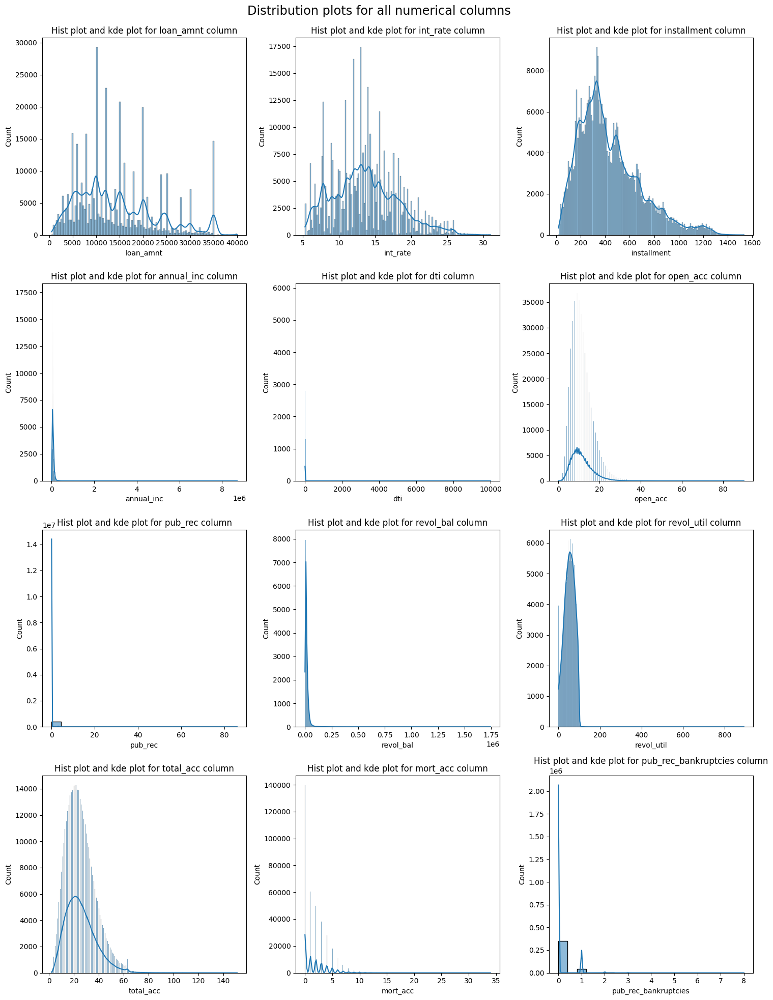

In [25]:
fig = plt.figure(figsize = (15,20))
fig.suptitle("Distribution plots for all numerical columns\n",fontsize = "xx-large" )
k = 1
for i in num_cols:
    plt.subplot(4,3,k)
    plt.title("Hist plot and kde plot for {} column".format(i))
    sns.histplot(data=LoanTap, x=i, kde=True)
    k = k+1
plt.tight_layout()
plt.show()

**Observation**
> Spikes can be observed in loan amount histplot particularly at round figures like 5000, 10000, 15000, 20000, 25000, 30000, 35000

> Most of the Numerical are concentrated at lower values like annual inc, dti, pub_rec, revol_bal, pub_rec_bankrupticies. But Maximum value is very large compared to that concentrated value. This implies It is log normal distribution. (Should check with np.log)

> Loan_amnt, int_rate, installment, total_acc, revol_util, open_acc, total_acc has approximated right skewed distribution.

>  Exponential Decreasing trend can be observed in mort_acc

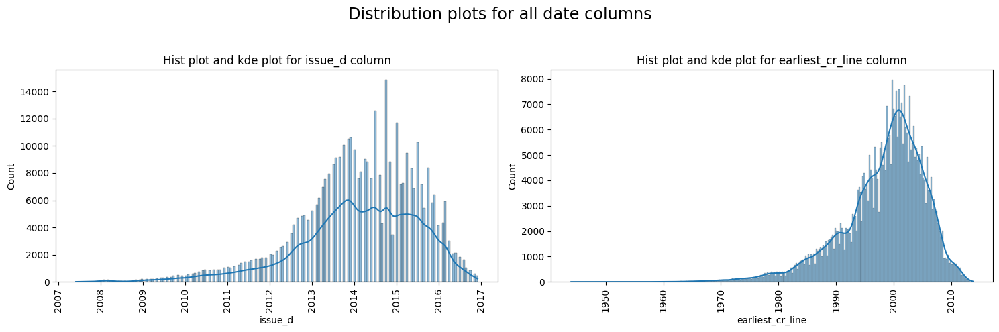

In [26]:
fig = plt.figure(figsize = (15,5))
fig.suptitle("Distribution plots for all date columns\n",fontsize = "xx-large" )
k = 1
for i in date_cols:
    plt.subplot(1,2,k)
    plt.title("Hist plot and kde plot for {} column".format(i))
    sns.histplot(data=LoanTap, x=i, kde=True)
    plt.xticks(rotation = 90)
    k = k+1
plt.tight_layout()
plt.show()

**Observations:**
> Above graphs suggests that Loantap started issuing loans from 2007. Gradually improvement upto 2015. Later there is dip in count value.

> In a way earliest cr line indicates the customer age, Loan Tap has customers with earliest cr year around 1950 to 2010. Most of the customers are started taking loans from 1990 to 2010.

### Box plots of all numerical columns

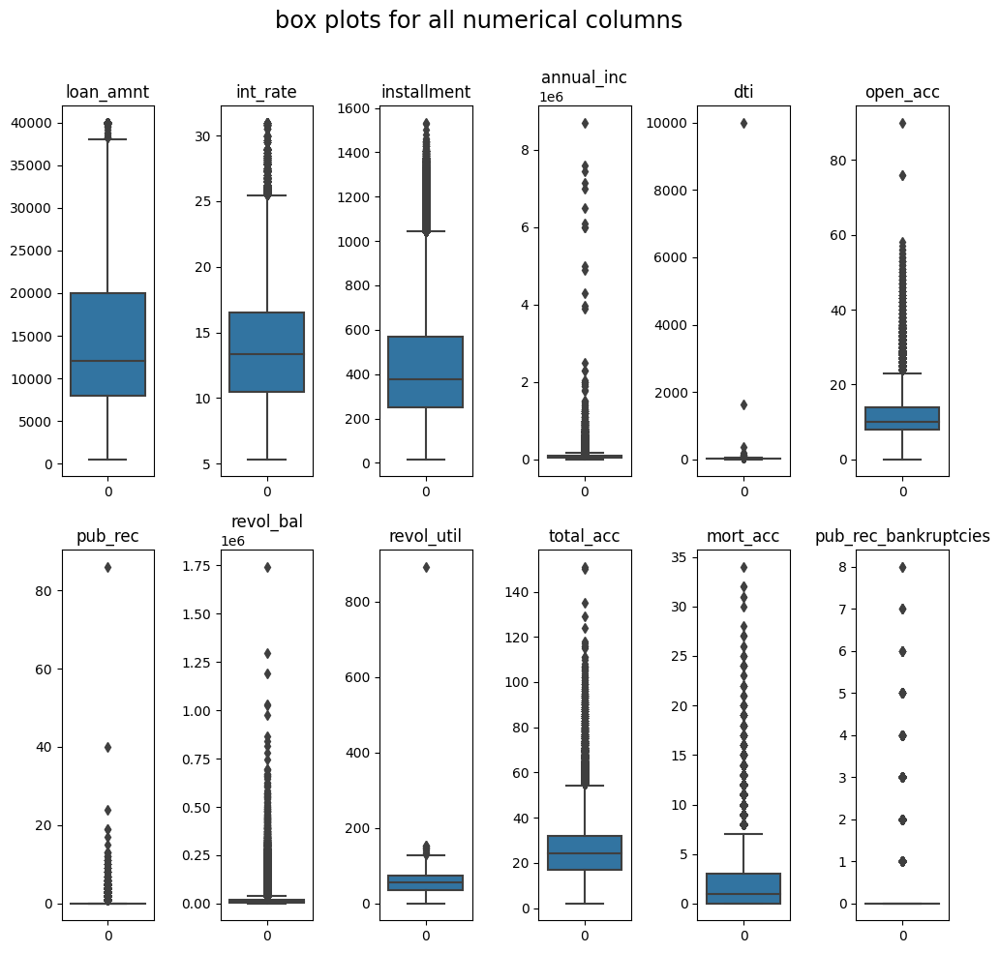

In [27]:
fig = plt.figure(figsize = (10,10))
fig.suptitle("box plots for all numerical columns\n",fontsize = "xx-large" )
k = 1
for i in num_cols:
    plt.subplot(2,6,k)
    plt.title("{}".format(i))
    sns.boxplot(data=LoanTap[i])
    k = k+1
plt.tight_layout()
plt.show()

**Observation**
> Clearly all numerical columns have outliers

Distribution plots of all the continuous variables, Barplots/Countplots of all the categorical variables

### Count plots for all categorical columns

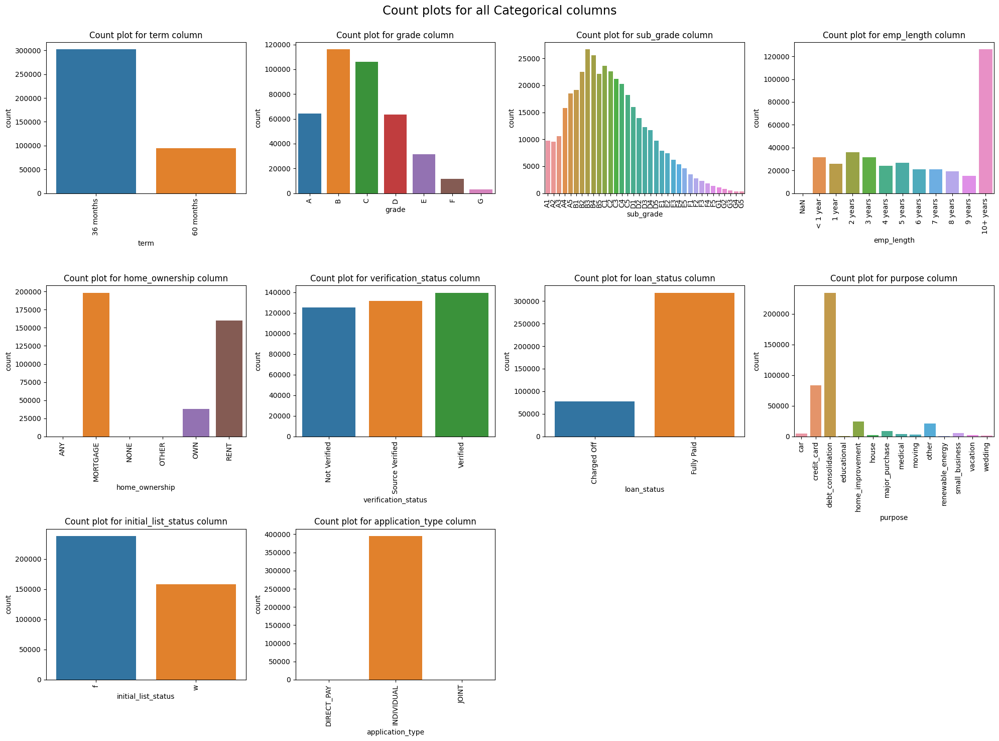

In [28]:
fig = plt.figure(figsize = (20,15))
fig.suptitle("Count plots for all Categorical columns\n",fontsize = "xx-large" )
k = 1
for i in cat_cols:
    if LoanTap[i].nunique()<50:
        plt.subplot(3,4,k)
        plt.title("Count plot for {} column".format(i))
        sns.countplot(data=LoanTap, x=i)
        plt.xticks(rotation = 90)
        k = k+1
plt.tight_layout()
plt.show()

In [11]:
LoanTap["loan_status"].value_counts()

Fully Paid     318357
Charged Off     77673
Name: loan_status, dtype: int64

In [518]:
318357*100/(318357+77673)

80.38709188697825

**Observations**
> 36 months loans are significantly more than 60 months loans

> B Grade has higher amount loans, G Grade has least number. Grades indicates interest rates or risk in a way. 

>  Sub grade also mimics the grade behaviour. B3 grade has higher amount of loans, G5 has lower amount of loans.

> 10+ years emp length are prefering to take loans

> Most of home ownership occupied either mortage(trying to get home), Own or Rent. (Can negelect remaining categories)

> **Loan Status (target variable) is clearly imbalanced and 80.38% are fully paid**

> debt_cosolidation and credit card is dominating purpose.

> initial _list _status fractional(F) > Whole(W)

> Almost all customers are Individual application type only 

## BIVARIATE ANALYSIS

### Categorical Vs Categorical

In [63]:
cat_perm = list(permutations(cat_cols,2))
cat_comb = list(combinations(cat_cols,2))

In [30]:
fig = plt.figure(figsize = (3*8,len(cat_perm)*8/3))
plt.suptitle("Stacked hist plots on each category column permutation\n",fontsize="xx-large")
k = 1
for p,q in cat_perm:
    if (LoanTap[p].nunique()<50) and (LoanTap[q].nunique()<50):
        plt.subplot(math.ceil(len(cat_perm)/3),3,k)
        plt.title(f"cross tab between {p} and {q} \nnormalising about {q} in percentages")
        k += 1
        plot = LoanTap.groupby([p])[q].value_counts(normalize=True).mul(100).reset_index(name='percentage')
        sns.histplot(x = p , hue = q, weights= 'percentage', multiple = 'stack',data=plot,shrink = 0.7)
        plt.xticks(rotation = 90)
        warnings.filterwarnings('ignore')
plt.tight_layout()
plt.subplots_adjust(top=0.97)
plt.show()
warnings.filterwarnings('ignore')

**Observations:**<br>
**`term` vs**
> `grade` or 'subgrade' indicates in 36 months --> B grade, 60 months --> C Grade dominates (avg interes rates will be higher for 60 months)

>`verification status` indicates 36 months has less verified than 60 months (60 months required high security in verification of annual income)

> `loan_status` (target variable) indicates 36 months dominates in fully paid loan_status (60 months is riskier than 36 months)

> `initial list status` indicates 60 months has more whole funding investors (60 months category attracts whole funding investors as they have high interest but high risk too)

**`grade` vs**
> `term` indicates Gradual increase in count of 60 months form A to G (Relationship exists between grade and term)

>`subgrade` indicates Count of 1st categories like (A1,B1,C1,....)(less int_rate) decreases from A to G and count of 5th categories like (A5,B5,C5,....)(high_int_rate) increases from A to G. (risk takers are increasing from A to G)

> `home_ownership` indicates clearly that A grade has dominating Mortage home_ownership compared to other grades.

> `verification status` indicates "not verified" members gradually decreases from A to G

> `loan_status` indicates Charged off candidates increases from A to G

> `initial_list_status` indicates no relationship (fluctuates)

**`subgrade` mimics the behaviour of grade (with more categories). (strong relationship can be observed between grade and subgrade**

**`emp_length` vs**
> `home_ownership` indicates mortgage person increase from 1year to 10 years gradually (more number of people takes home with increase in working experience)

**`home ownership` vs**
> `verification status` indicates with ANY and None category should be verified at any cost. (as there is no home loan, loan tap can't acquire any assets of individual if they are charged off)

> `loan_status` indicates interestingly "any" catgory has dominating full paid cadidates.

> `purpose` indicates except in "any" category remaining category has debt consolidation as dominating category. But "any" has other or renewable energy as dominating purpose

> 'initial_list_status' indicates "any" has whole funding investors only

**`loan status` vs** (target variable)
> **`term` indicates 60 months has more charged off persons**

>**`grade` indicates C grade dominates in charged off, B grade dominates in Fully paid.**

>**`home_ownership` indicates rent category persons has charged off more as rent persons can change their home address easily**

>**`verification status` indicates even verified persons has charged off more. Verification maynot sufficient to decrease the charged off.**

> **`initial_list_status` indicates that it is identical in for charged off and fully paid.

**`purpose` vs**
>`term` indicates education category has mostly 36 months term

> `emp_length` there is some correlation between purpose and emp_length.

> `home_ownership` indicates Mortgage and  home_improvement has strong relation. Moving and rent has strong relation. House and rent has strong relation.

>`verification status` indicates education has more not verified status.

> `loan_status` indicates there is no relation between them(fluctuates)

> `initial list status` indicates education has fully fractional listing status. wedding also has fractional list status as highly dominating.

**`application type` vs**
> `term` indicates Joint applications have 60 months term dominating

>`grade` indicates Direct pay have DEFG grades dominating. Individual and Joint have ABCD grades dominating

> `home ownership` indicates Mortgage dominates in JOINT applicatin than Direct pay

> `verification status` indicates Direct Pay and Joint has more verified applications than Individual

> `loan status` indicates Direct Pay has more charged off persons than Joint applications 

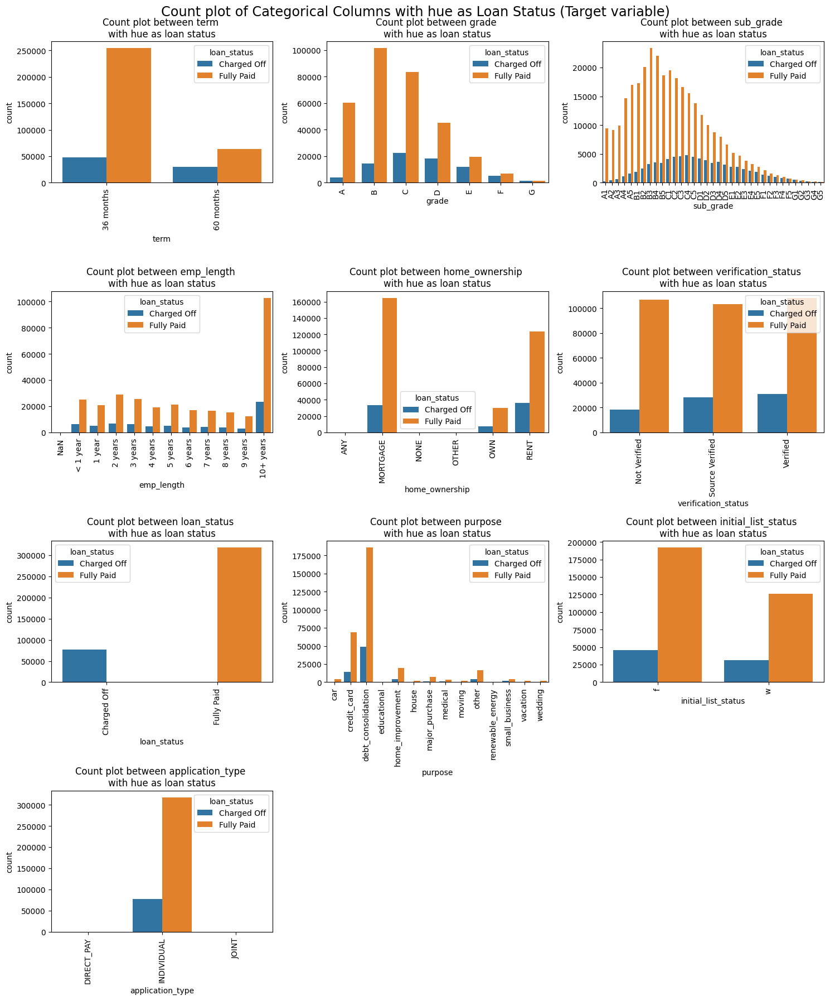

In [31]:
fig = plt.figure(figsize = (3*5,len(cat_cols)*5/3))
plt.suptitle("Count plot of Categorical Columns with hue as Loan Status (Target variable)\n",fontsize = "xx-large")
k = 1
for p in cat_cols:
    if LoanTap[p].nunique()<=50:
        plt.subplot(math.ceil(len(cat_cols)/3),3,k)
        plt.title(f"Count plot between {p} \nwith hue as loan status")
        k += 1
        sns.countplot(data = LoanTap,x = p,hue ="loan_status")
        plt.xticks(rotation = 90)
plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()
warnings.filterwarnings('ignore')

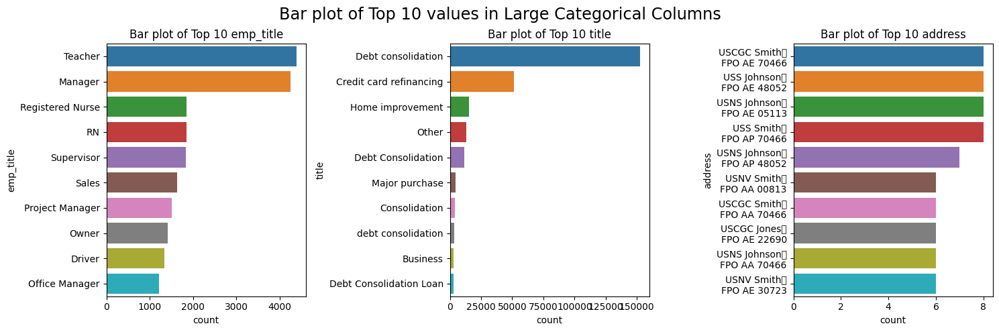

In [525]:
fig = plt.figure(figsize = (15, 5))
plt.suptitle("Bar plot of Top 10 values in Large Categorical Columns\n",fontsize = "xx-large")
k = 1
for p in cat_cols:
    if LoanTap[p].nunique()>=50:
        plt.subplot(1,3,k)
        plt.title(f"Bar plot of Top 10 {p}")
        k += 1
        top_10 = LoanTap[p].value_counts()[:10].reset_index()
        top_10.columns = [p, 'count']
        sns.barplot(x='count', y=p, data=top_10, orient='h')
plt.tight_layout()
plt.subplots_adjust(top=0.87)
plt.show()
warnings.filterwarnings('ignore')

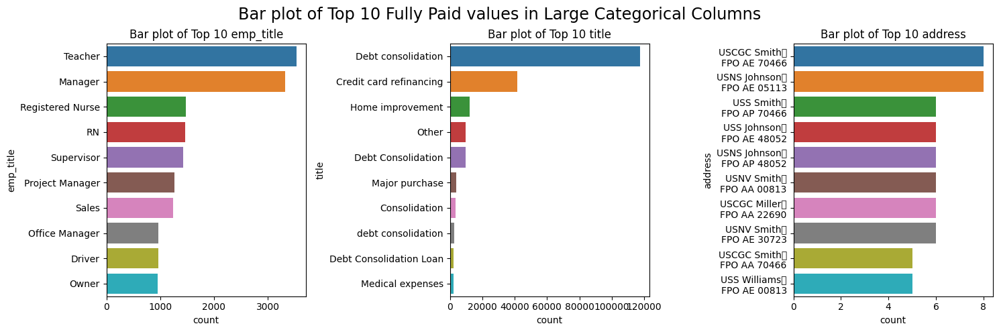

In [527]:
fig = plt.figure(figsize = (15, 5))
plt.suptitle("Bar plot of Top 10 Fully Paid values in Large Categorical Columns\n",fontsize = "xx-large")
k = 1
for p in cat_cols:
    if LoanTap[p].nunique()>=50:
        plt.subplot(1,3,k)
        plt.title(f"Bar plot of Top 10 {p}")
        k += 1
        top_10 = LoanTap[LoanTap["loan_status"]=="Fully Paid"][p].value_counts()[:10].reset_index()
        top_10.columns = [p, 'count']
        sns.barplot(x='count', y=p, data=top_10, orient='h')
plt.tight_layout()
plt.subplots_adjust(top=0.87)
plt.show()
warnings.filterwarnings('ignore')

In [523]:
LoanTap[LoanTap["loan_status"]=="Fully Paid"]["emp_title"]

array(['Fully Paid', 'Charged Off'], dtype=object)

**Observations**
> B grade and B3 Sub grade have highest fully paid status

> C grade and C4 Sub grade have highest charged off status

> Even verified status has same proportion of charged off candidates

> debt consolidation has highest chance to pay fully paid loan

> 10+ years have highest chance to pay the loan fully

> 36 months have highest chance to pay the loan fully

> Mortgage and Rent are having highest chance to pay the loan fully

> Teacher and manager have more loan applications

> similar to purpose, Debt cosolidation and credit card refinancing has highest applications in title.     



Relationships between important variables

In [64]:
Cat_Vs_Num = []
for i in range(len(cat_cols)):
    for j in range(len(num_cols)):
        if (LoanTap[cat_cols[i]].nunique()<50):
            Cat_Vs_Num.append((cat_cols[i], num_cols[j]))
print(Cat_Vs_Num)
print(len(Cat_Vs_Num))

[('term', 'loan_amnt'), ('term', 'int_rate'), ('term', 'installment'), ('term', 'annual_inc'), ('term', 'dti'), ('term', 'open_acc'), ('term', 'pub_rec'), ('term', 'revol_bal'), ('term', 'revol_util'), ('term', 'total_acc'), ('term', 'mort_acc'), ('term', 'pub_rec_bankruptcies'), ('grade', 'loan_amnt'), ('grade', 'int_rate'), ('grade', 'installment'), ('grade', 'annual_inc'), ('grade', 'dti'), ('grade', 'open_acc'), ('grade', 'pub_rec'), ('grade', 'revol_bal'), ('grade', 'revol_util'), ('grade', 'total_acc'), ('grade', 'mort_acc'), ('grade', 'pub_rec_bankruptcies'), ('sub_grade', 'loan_amnt'), ('sub_grade', 'int_rate'), ('sub_grade', 'installment'), ('sub_grade', 'annual_inc'), ('sub_grade', 'dti'), ('sub_grade', 'open_acc'), ('sub_grade', 'pub_rec'), ('sub_grade', 'revol_bal'), ('sub_grade', 'revol_util'), ('sub_grade', 'total_acc'), ('sub_grade', 'mort_acc'), ('sub_grade', 'pub_rec_bankruptcies'), ('emp_length', 'loan_amnt'), ('emp_length', 'int_rate'), ('emp_length', 'installment'),

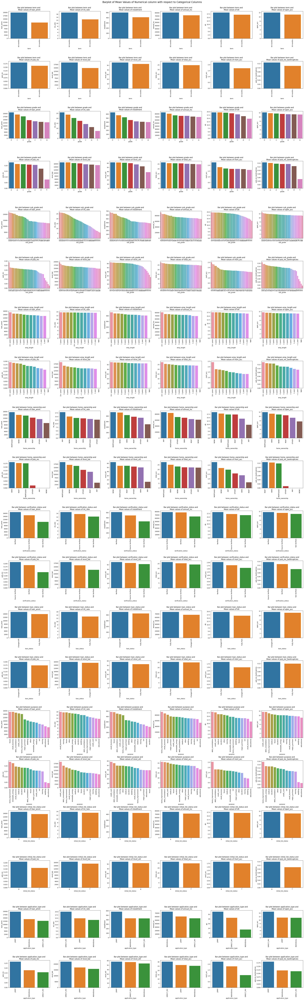

In [34]:
fig = plt.figure(figsize = (6*5,len(Cat_Vs_Num)*5/6))
plt.suptitle("Barplot of Mean Values of Numerical column with respect to Categorical Columns\n",fontsize = "xx-large")
k = 1
for p,q in Cat_Vs_Num:
    plt.subplot(math.ceil(len(Cat_Vs_Num)/6),6,k)
    plt.title(f"Bar plot between {p} and \nMean values of {q}")
    k += 1
    df = pd.DataFrame(LoanTap.groupby([p])[[q]].mean().reset_index())
    sns.barplot(data = df,x = p,y= q,order = df.sort_values(q,ascending = False)[p])
    plt.xticks(rotation = 90)
plt.tight_layout()
plt.subplots_adjust(top=0.97)
plt.show()
warnings.filterwarnings('ignore')

**Observations:**<br>
**`term` vs**
> mean value of all the numerical columns except `pub_rec, pub_rec_bankruptcies` 60 months > 30 months

**`grade` vs**
> G grade has highest mean `loan amnt, int rate, installment, open acc, pub_rec, revol bal`

> A grade has highest mean `annual inc, total acc, mort_acc`

> E grade has highest mean `dti`

> F grade has highest mean `revol util`

> C grade has highest mean `pub_rec_bankruptcies`

> B grade has lowest mean `loan_amnt, installment, open_acc`

> A grade has lowest mean `int_rate, dti, pub_rec, revol_util, pub_rec_bankruptcies`

> D grade has lowest mean `annual inc, revol_bal, mort_acc`

**`emp_length` is following similar trend with all numerical columns**

**`home ownership` vs**
> Mortgage has highest mean in `loan_amnt, installment, open acc, revol bal, total acc, mort acc`

> Any has highest mean in `int rate, annual inc`

> Rent has highest mean in `pub rec bankruptcies`

> Any or none or other is prevailing in lowest mean of all numerical columns

**`verification status` vs**
> Not verified las lowest mean in all numerical columns

**`loan status` (target variable) vs**
> **Charged off has highest mean for all numerical columns except `annual inc, revol bal, total acc, mort acc`**

**`purpose` vs**
> house, home improvement are having highest mean in `loan amnt, annual inc, pub rec, total acc, mort acc, pub rec bankruptcies`

> small business is having highest mean in `int rate, installment`

> debt cosolidation is having highest mean in `dti`

> credit card is having highest mean in `open acc, revol balance, revol, util`

**`initial list status` - whole has highest mean in all numerical columns except `int rate, revol_util`**

**`application` vs**
> Joint type has highest mean in `loan amnt, installment, dti, pub rec, revol bal, mort acc, pub rec bankruptcies`

> Direct pay has highest mean in `int rate, open acc, revol bal, total acc`

> Individual has highest mean in `annual inc` 

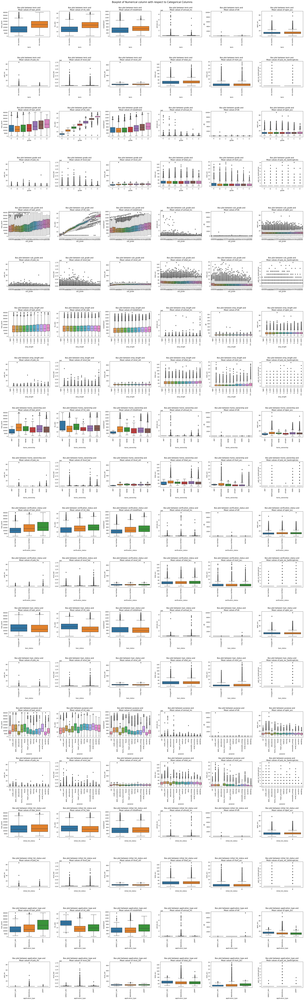

In [35]:
fig = plt.figure(figsize = (6*5,len(Cat_Vs_Num)*5/6))
plt.suptitle("Boxplot of Numerical column with respect to Categorical Columns",fontsize = "xx-large")
k = 1
for p,q in Cat_Vs_Num:
    plt.subplot(math.ceil(len(Cat_Vs_Num)/6),6,k)
    plt.title(f"Box plot between {p} and \nMean values of {q}")
    k += 1
    sns.boxplot(data = LoanTap,x = p,y= q)
    plt.xticks(rotation = 90)
plt.tight_layout()
plt.subplots_adjust(top=0.97)
plt.show()
warnings.filterwarnings('ignore')

**Observations:**
> Outliers are present in all combinations

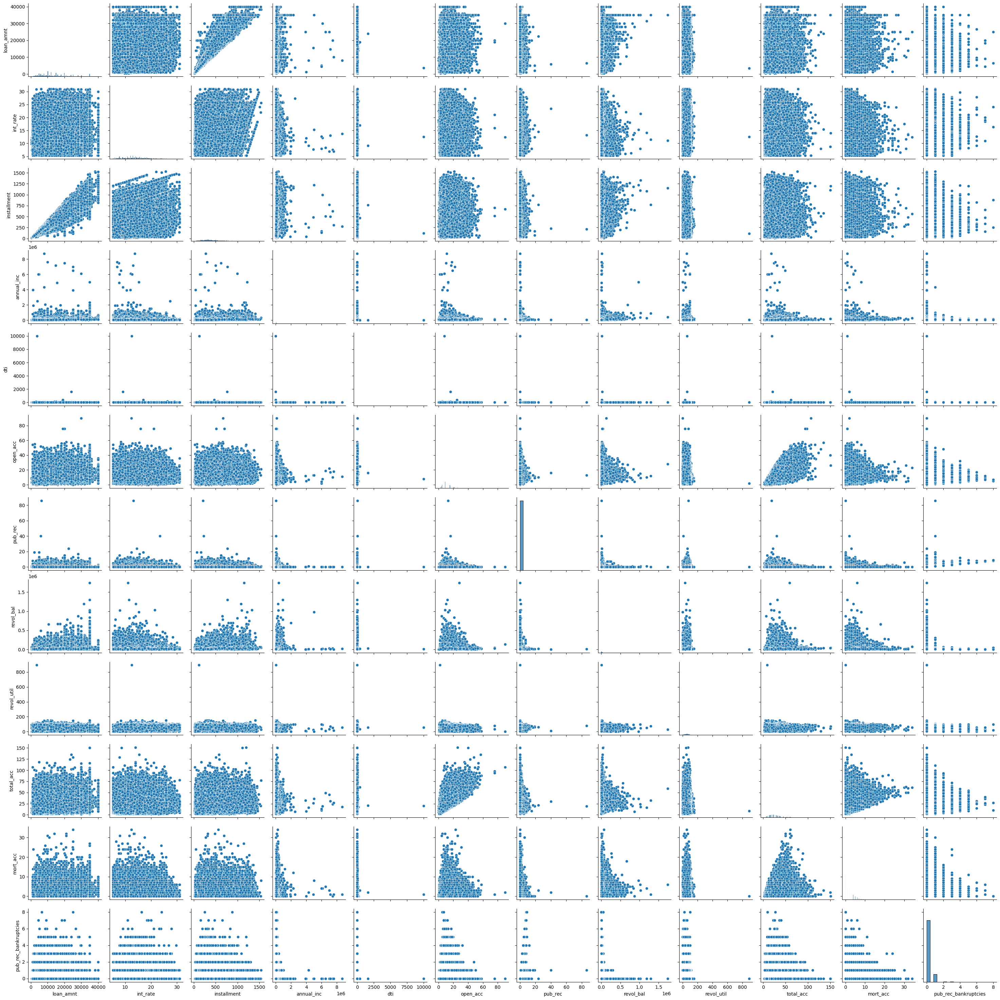

In [36]:
sns.pairplot(data = LoanTap)

**Observations**
> Linear trend is not observed in any pair plot

C:\Users\saina\AppData\Local\Temp\ipykernel_12096\3063054567.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(LoanTap.corr(), cmap="YlGnBu", annot=True)


<Axes: >

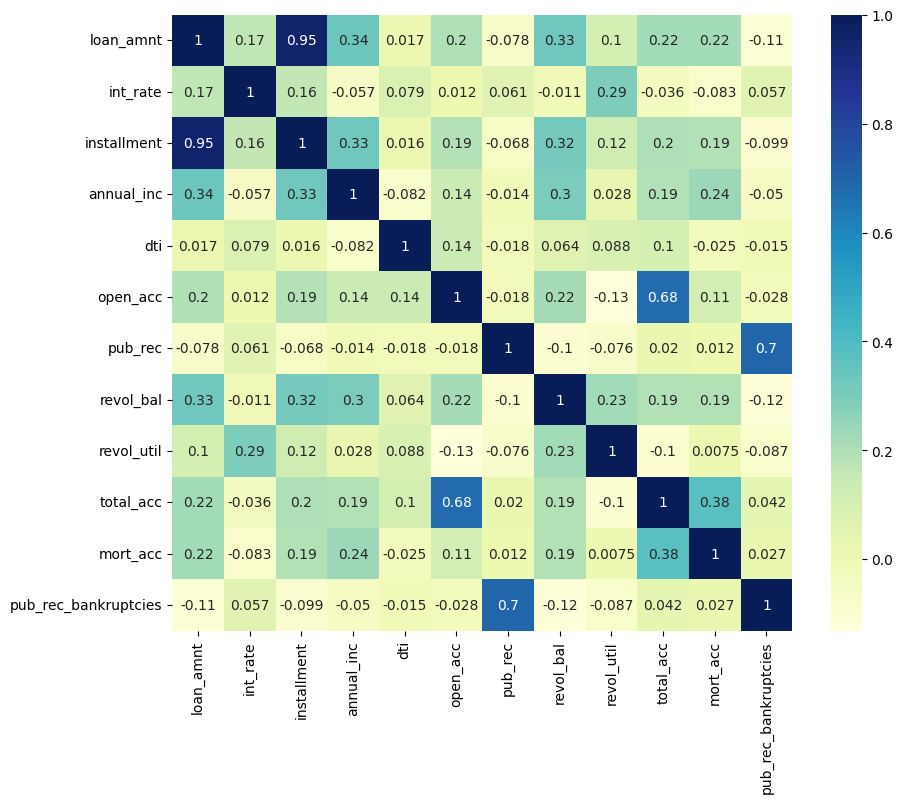

In [15]:
fig = plt.figure(figsize= (10,8))
sns.heatmap(LoanTap.corr(), cmap="YlGnBu", annot=True)

C:\Users\saina\AppData\Local\Temp\ipykernel_12096\4068929963.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(LoanTap.corr(method = "spearman"), cmap="YlGnBu", annot=True)


<Axes: >

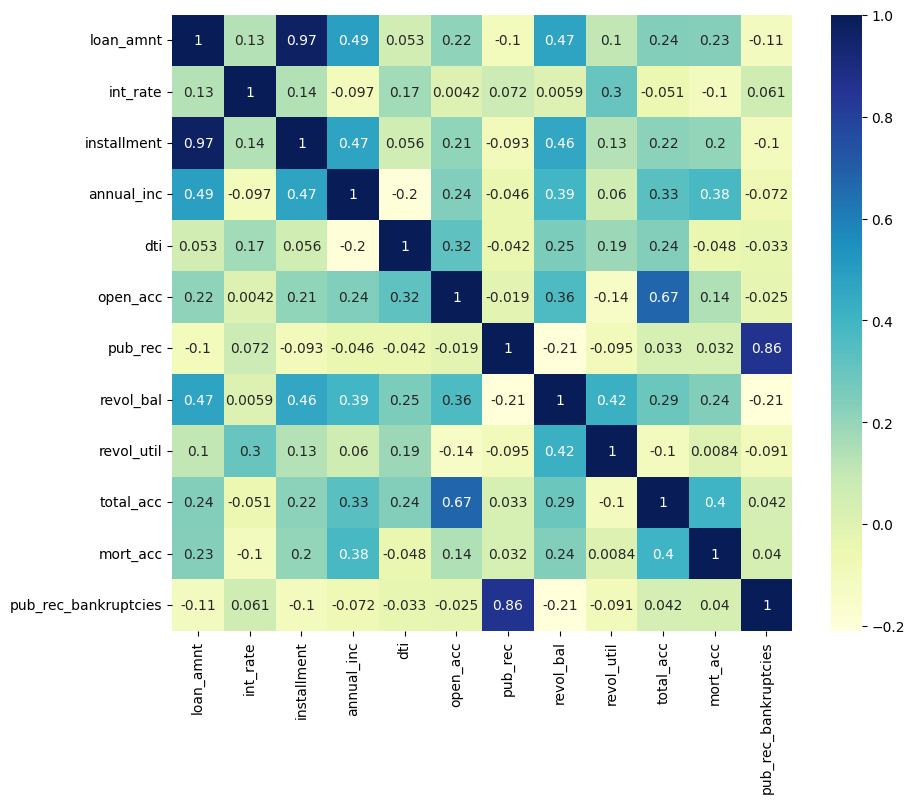

In [16]:
fig = plt.figure(figsize= (10,8))
sns.heatmap(LoanTap.corr(method = "spearman"), cmap="YlGnBu", annot=True)

**Observations**
> High correlations between (> 0.6)

    1. loan amnt vs installment
    2. total acc vs open acc
    3. pub rec bank ruptcies vs pub rec

In [65]:
#combinations of three in such a way that first two are numerical columns and third is categorical col (considering only target column)
Num_Num_Cat = []
num_comb = list(combinations(num_cols,2))
for i in range(len(num_comb)):
    Num_Num_Cat.append(list(num_comb[i])+["loan_status"])
print(Num_Num_Cat)
print(len(Num_Num_Cat))

[['loan_amnt', 'int_rate', 'loan_status'], ['loan_amnt', 'installment', 'loan_status'], ['loan_amnt', 'annual_inc', 'loan_status'], ['loan_amnt', 'dti', 'loan_status'], ['loan_amnt', 'open_acc', 'loan_status'], ['loan_amnt', 'pub_rec', 'loan_status'], ['loan_amnt', 'revol_bal', 'loan_status'], ['loan_amnt', 'revol_util', 'loan_status'], ['loan_amnt', 'total_acc', 'loan_status'], ['loan_amnt', 'mort_acc', 'loan_status'], ['loan_amnt', 'pub_rec_bankruptcies', 'loan_status'], ['int_rate', 'installment', 'loan_status'], ['int_rate', 'annual_inc', 'loan_status'], ['int_rate', 'dti', 'loan_status'], ['int_rate', 'open_acc', 'loan_status'], ['int_rate', 'pub_rec', 'loan_status'], ['int_rate', 'revol_bal', 'loan_status'], ['int_rate', 'revol_util', 'loan_status'], ['int_rate', 'total_acc', 'loan_status'], ['int_rate', 'mort_acc', 'loan_status'], ['int_rate', 'pub_rec_bankruptcies', 'loan_status'], ['installment', 'annual_inc', 'loan_status'], ['installment', 'dti', 'loan_status'], ['installmen

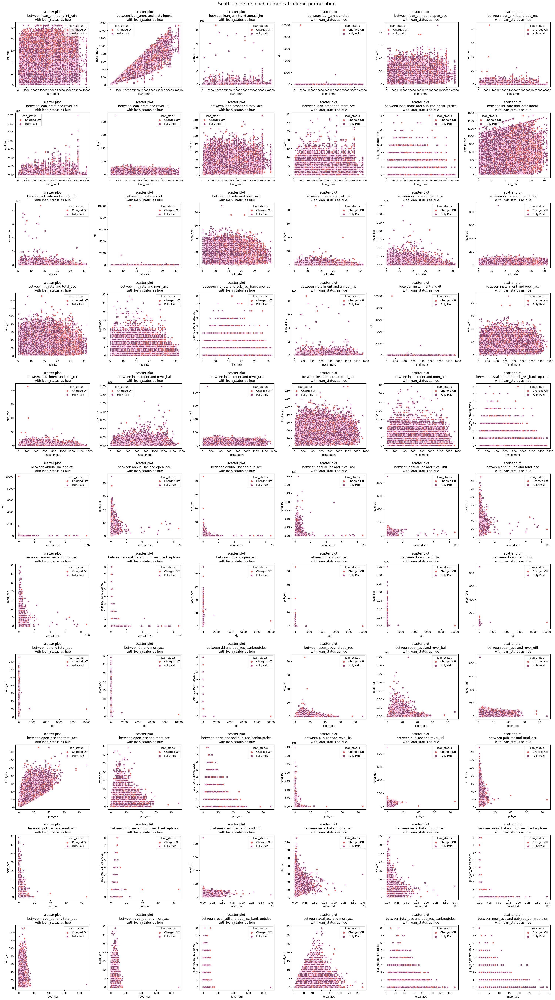

In [40]:
fig = plt.figure(figsize = (6*5,len(Num_Num_Cat)*5/6))
plt.suptitle("Scatter plots on each numerical column permutation\n",fontsize="xx-large")
k = 1
for p,q,r in Num_Num_Cat:
    plt.subplot(math.ceil(len(Num_Num_Cat)/6),6,k)
    plt.title(f"scatter plot \nbetween {p} and {q} \nwith {r} as hue")
    k += 1
    sns.scatterplot(data=LoanTap,x=p,y=q,hue = r,style = r, palette = "flare")
    warnings.filterwarnings('ignore')
plt.tight_layout()
plt.subplots_adjust(top=0.96)
plt.show()
warnings.filterwarnings('ignore')

**Observations**
> Scatter plot with respect to loan status has mixed up. (Not separated clusters, not homogenous)

# CHAPTER 2: DATA PREPROCESSING

## DUPLICATE VALUE CHECK

In [18]:
LoanTap.duplicated().sum()

0

## MISSING VALUE TREATMENT

### Missing value treatment of emp_title

> Replacing the NaN emp_titles as new category -> UNKNOWN

In [66]:
LoanTap["emp_title"].fillna("UNKNOWN",inplace = True)

### Missing value treatment of title

In [67]:
Null_replace_dict_purpose_title = {}
for i in LoanTap["purpose"].unique():
    Null_replace_dict_purpose_title[i] = LoanTap[LoanTap["purpose"] == i]["title"].mode()[0]
print(Null_replace_dict_purpose_title)

{'vacation': 'Vacation', 'debt_consolidation': 'Debt consolidation', 'credit_card': 'Credit card refinancing', 'home_improvement': 'Home improvement', 'small_business': 'Business', 'major_purchase': 'Major purchase', 'other': 'Other', 'medical': 'Medical expenses', 'wedding': 'Wedding Loan', 'car': 'Car financing', 'moving': 'Moving and relocation', 'house': 'Home buying', 'educational': 'Student Loan', 'renewable_energy': 'Green loan'}


In [68]:
LoanTap["title"] = LoanTap["title"].fillna(LoanTap["purpose"].map(Null_replace_dict_purpose_title))

### Missing value treatment of emp_length

In [69]:
Imputer = SimpleImputer(strategy="most_frequent")
LoanTap["emp_length"] = Imputer.fit_transform(LoanTap["emp_length"].values.reshape(-1,1))

### Missing value treatement of remaining numerical columns - pub_rec_bankruptcies, revol_util, mort_acc

In [70]:
pub_rec_median = LoanTap.groupby("pub_rec").median().mort_acc
def fill_pub_rec_bankruptcies(pub_rec,pub_rec_bankruptcies):
    if np.isnan(pub_rec_bankruptcies):
        return pub_rec_median[pub_rec].round()
    else:
        return pub_rec_bankruptcies
LoanTap['pub_rec_bankruptcies']=LoanTap.apply(lambda x: fill_pub_rec_bankruptcies(x['pub_rec'],x['pub_rec_bankruptcies']),axis=1)

C:\Users\saina\AppData\Local\Temp\ipykernel_12096\154728262.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.median is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  pub_rec_median = LoanTap.groupby("pub_rec").median().mort_acc


In [71]:
total_acc_median = LoanTap.groupby("total_acc").median().mort_acc
def fill_mort_acc(total_acc,mort_acc):
    if np.isnan(mort_acc):
        return total_acc_median[total_acc].round()
    else:
        return mort_acc
LoanTap['mort_acc']=LoanTap.apply(lambda x: fill_mort_acc(x['total_acc'],x['mort_acc']),axis=1)

C:\Users\saina\AppData\Local\Temp\ipykernel_12096\15731850.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.median is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  total_acc_median = LoanTap.groupby("total_acc").median().mort_acc


In [72]:
Imputer = KNNImputer(n_neighbors= 10)
LoanTap["revol_util"]=Imputer.fit_transform(LoanTap["revol_util"].values.reshape(-1,1))

### Missing value check

In [31]:
sum(LoanTap.isna().sum())

0

## OUTLIER TREATMENT

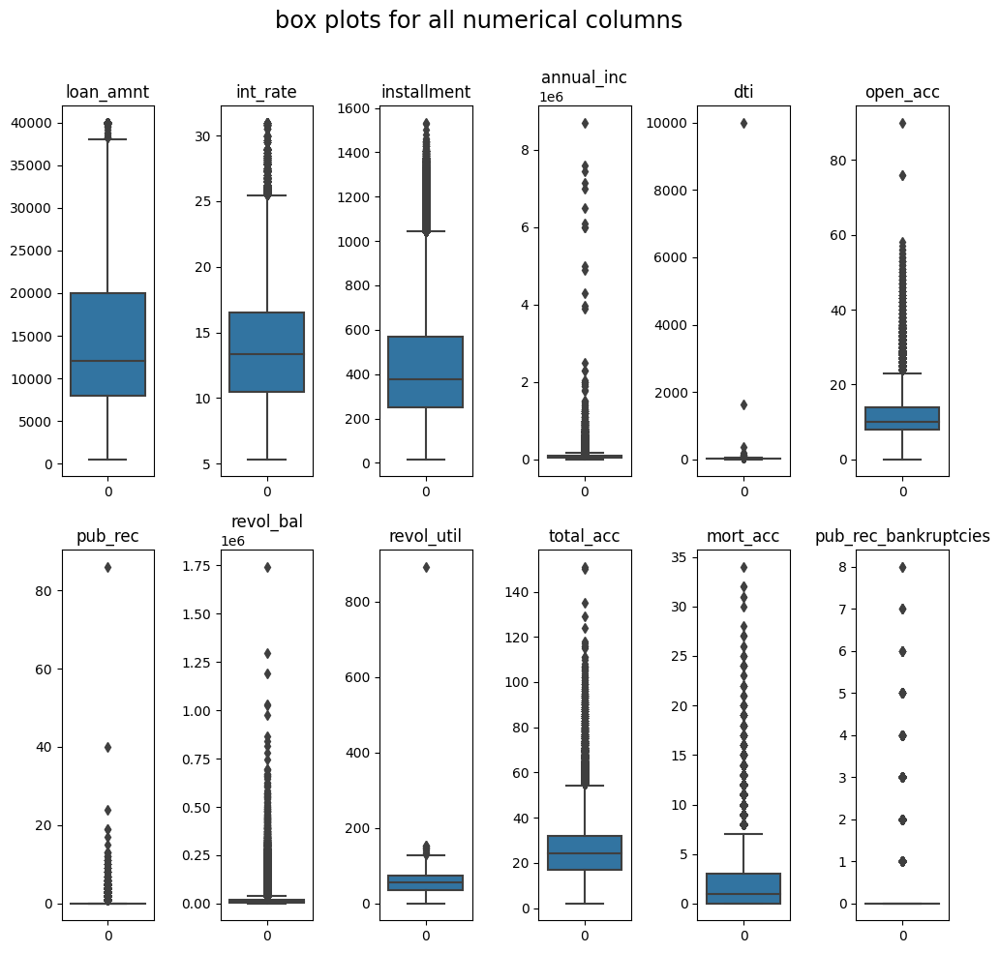

In [32]:
fig = plt.figure(figsize = (10,10))
fig.suptitle("box plots for all numerical columns\n",fontsize = "xx-large" )
k = 1
for i in num_cols:
    plt.subplot(2,6,k)
    plt.title("{}".format(i))
    sns.boxplot(data=LoanTap[i])
    k = k+1
plt.tight_layout()
plt.show()

### Removing the outliers of pub_rec, pub_rec_bankruptcies

> As all the values other than zero are outliers in `pub_rec, pub_rec_bankruptcies`, To remove the outliers, Treat all Outliers as 1 and zero as 0. Convert them to Binary column

In [73]:
def pub_rec(number):
    if number == 0.0:
        return 0
    else:
        return 1
def pub_rec_bankruptcies(number):
    if number == 0.0:
        return 0
    else:
        return 1
LoanTap['pub_rec']=LoanTap.pub_rec.apply(pub_rec)
LoanTap['pub_rec_bankruptcies']=LoanTap.pub_rec_bankruptcies.apply(pub_rec_bankruptcies)

In [74]:
LoanTap["pub_rec"] = LoanTap["pub_rec"].astype('category')
LoanTap["pub_rec_bankruptcies"] = LoanTap["pub_rec_bankruptcies"].astype('category')

> Remove pub_rec, pub_rec_bankruptcies from num_cols as they are binary type column

In [75]:
num_cols.remove("pub_rec")
num_cols.remove("pub_rec_bankruptcies")

### Remove outliers by using IQR capping method for all remaining numerical columns

In [76]:
def detect_outliers_iqr(df,i):
    q1 = df[i].quantile(0.25)
    q3 = df[i].quantile(0.75)
    IQR = q3-q1
    lwr_bound = q1-(1.5*IQR)
    upr_bound = q3+(1.5*IQR)
    df[i]= pd.DataFrame(np.where(df[i] > upr_bound, upr_bound,(np.where(df[i] <lwr_bound,lwr_bound, df[i]))), columns=[i])
for i in num_cols:
    detect_outliers_iqr(LoanTap,i)

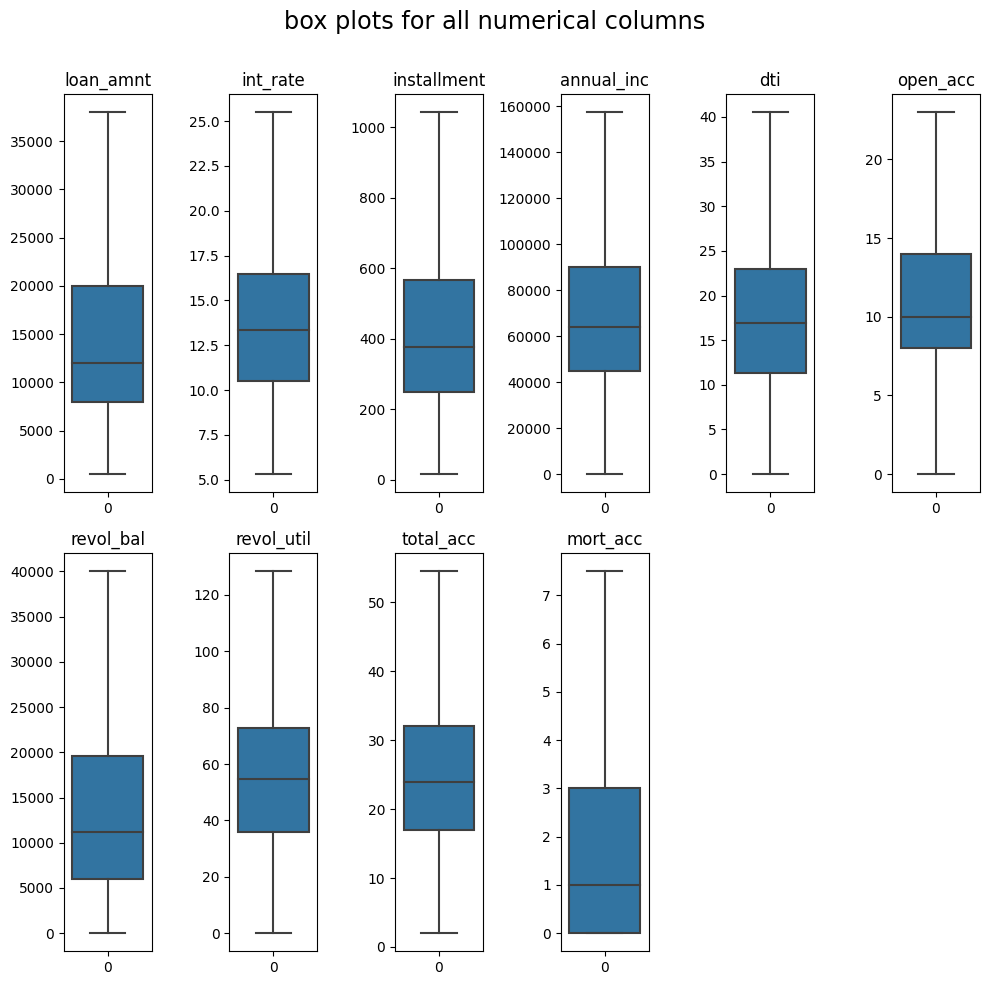

In [30]:
fig = plt.figure(figsize = (10,10))
fig.suptitle("box plots for all numerical columns\n",fontsize = "xx-large" )
k = 1
for i in num_cols:
    plt.subplot(2,6,k)
    plt.title("{}".format(i))
    sns.boxplot(data=LoanTap[i])
    k = k+1
plt.tight_layout()
plt.show()

## FEATURE ENGINEERING

In [77]:
LoanTap["days_from_first_loan"] =  (LoanTap["issue_d"]-LoanTap["earliest_cr_line"]).dt.days

<Axes: xlabel='days_from_first_loan', ylabel='Count'>

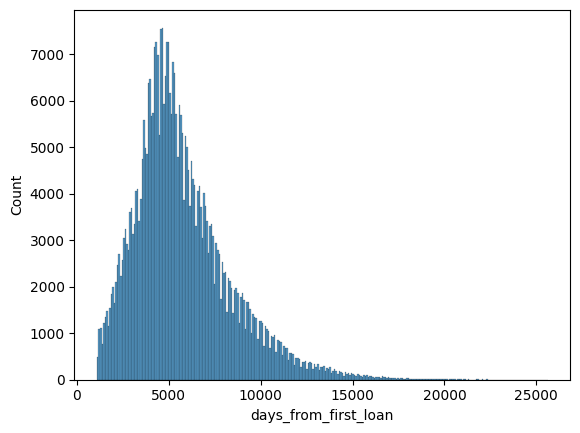

In [39]:
sns.histplot(LoanTap["days_from_first_loan"])

<Axes: >

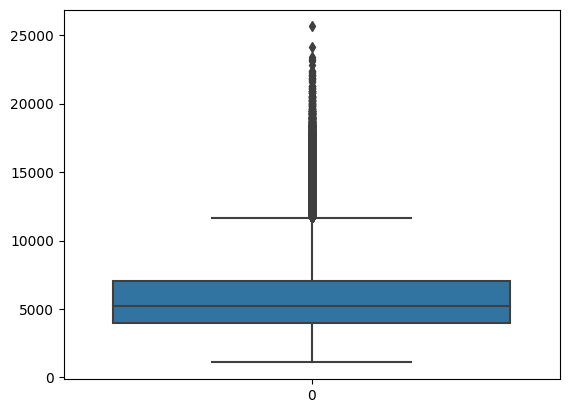

In [58]:
sns.boxplot(LoanTap["days_from_first_loan"])

<Axes: xlabel='loan_status', ylabel='days_from_first_loan'>

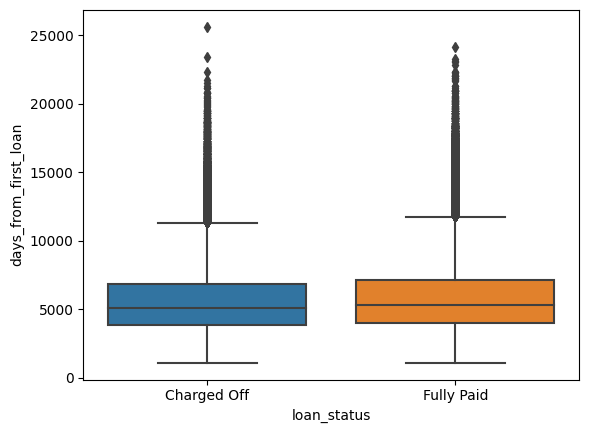

In [59]:
sns.boxplot(data = LoanTap,x = "loan_status", y="days_from_first_loan")

In [78]:
detect_outliers_iqr(LoanTap,"days_from_first_loan")

<Axes: >

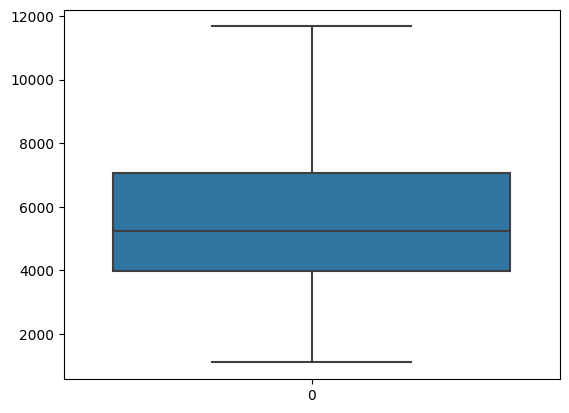

In [79]:
sns.boxplot(LoanTap["days_from_first_loan"])

### Extract State and ZIP code from Address

In [34]:
LoanTap["address"][0].split()

['0174', 'Michelle', 'Gateway', 'Mendozaberg,', 'OK', '22690']

In [80]:
LoanTap["zip_code"]= LoanTap["address"].apply(lambda x: x.split()[-1])
LoanTap["state"]= LoanTap["address"].apply(lambda x: x.split()[-2])

In [81]:
LoanTap["zip_code"] = LoanTap["zip_code"].astype("category")

<Axes: xlabel='zip_code', ylabel='count'>

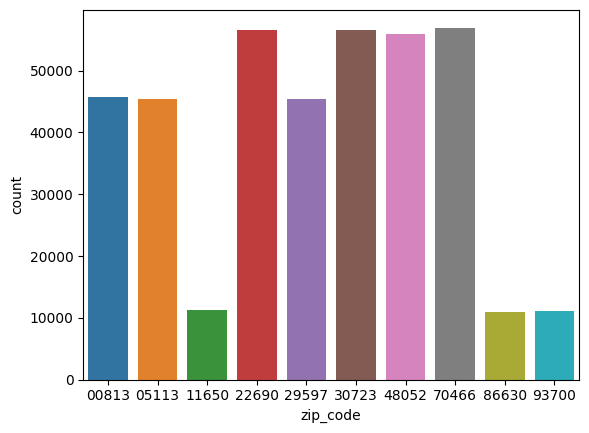

In [45]:
sns.countplot(data = LoanTap, x = "zip_code")

In [66]:
LoanTap["state"].nunique()

54

In [37]:
print(sorted(LoanTap["state"].unique()))

['AA', 'AE', 'AK', 'AL', 'AP', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL', 'GA', 'HI', 'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'MA', 'MD', 'ME', 'MI', 'MN', 'MO', 'MS', 'MT', 'NC', 'ND', 'NE', 'NH', 'NJ', 'NM', 'NV', 'NY', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'VA', 'VT', 'WA', 'WI', 'WV', 'WY']


In [82]:
state_dict = {"AA":"Armed Forces America", "AE":"Armed Forces","AK":"Alaska","AL":"Alabama",
              "AP":"Armed Forces Pacific","AR":"Arkansas","AZ":"Arizona","CA":"California",
              "CO":"Colorodo","CT":"Connecticut","DC":"Washington DC","DE":"Delaware",
              "FL":"Florida","GA":"Georgia","HI":"Hawaii","IA":"Iowa","ID":"Idaho","IL":"Illinois",
              "IN":"Indiana","KS":"Kansas","KY":"Kentucky","LA":"Louisiana","MA":"Massachusetts",
              "MD":"Maryland","ME":"Maine","MI":"Michigan","MN":"Minnesota","MO":"Missouri",
              "MS":"Mississippi","MT":"Montana","NC":"North Carolina","ND":"North Dakota",
              "NE":"Nebraska","NH":"New Hampshire","NJ":"New Jersey","NM":"New Mexico","NV":"Nevada",
              "NY":"New York","OH":"Ohio","OK":"Oklahoma","OR":"Oregon","PA":"Pennsylvania",
              "RI":"Rhode Island","SC":"South Carolina","SD":"South Dakota","TN":"Tennessee",
              "TX":"Texas","UT":"Utah","VA":"Virginia","VT":"Vermont","WA":"Washington",
              "WI":"Wisconsin","WV":"West Virginia","WY":"Wyoming"}

In [47]:
len(state_dict)

54

In [83]:
LoanTap["state"] = LoanTap.state.map(state_dict)

In [84]:
LoanTap["state"].unique()

array(['Oklahoma', 'South Dakota', 'West Virginia', 'Massachusetts',
       'Virginia', 'Delaware', 'Texas', 'Armed Forces',
       'Armed Forces Pacific', 'New Mexico', 'Mississippi', 'Oregon',
       'New Hampshire', 'Hawaii', 'Pennsylvania', 'Colorodo', 'Alabama',
       'Florida', 'Arizona', 'Wisconsin', 'North Carolina', 'Indiana',
       'Missouri', 'Armed Forces America', 'Tennessee', 'Kansas',
       'North Dakota', 'Connecticut', 'Wyoming', 'Nebraska',
       'Rhode Island', 'Arkansas', 'Michigan', 'Illinois', 'Louisiana',
       'New York', 'Iowa', 'Alaska', 'Utah', 'Maryland', 'Washington',
       'Minnesota', 'Ohio', 'Montana', 'New Jersey', 'Washington DC',
       'Nevada', 'Vermont', 'California', 'Maine', 'Idaho', 'Georgia',
       'Kentucky', 'South Carolina'], dtype=object)

In [85]:
LoanTap["state"] = LoanTap["state"].astype("category")

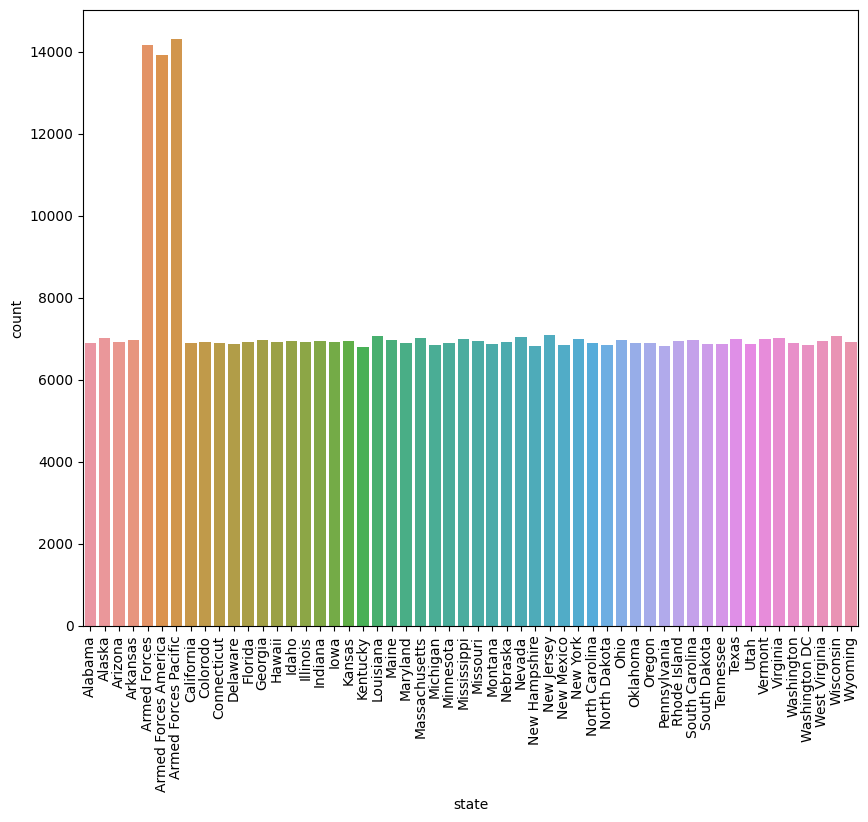

In [41]:
plt.figure(figsize=(10,8))
sns.countplot(data = LoanTap, x = "state")
plt.xticks(rotation = 90)
plt.show()

> Armed forces, Armed forces america and Armed forces pacific dominating these loans

In [74]:
LoanTap.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 396030 entries, 0 to 396029
Data columns (total 30 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   loan_amnt             396030 non-null  float64       
 1   term                  396030 non-null  category      
 2   int_rate              396030 non-null  float64       
 3   installment           396030 non-null  float64       
 4   grade                 396030 non-null  category      
 5   sub_grade             396030 non-null  category      
 6   emp_title             396030 non-null  object        
 7   emp_length            396030 non-null  object        
 8   home_ownership        396030 non-null  category      
 9   annual_inc            396030 non-null  float64       
 10  verification_status   396030 non-null  category      
 11  issue_d               396030 non-null  datetime64[ns]
 12  loan_status           396030 non-null  category      
 13 

## DATA PREPARATION FOR MODELLING

In [52]:
LoanTap.sample(3)

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,dti,earliest_cr_line,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address,days_from_first_loan,zip_code,state
66708,20000.0,36 months,11.53,659.81,B,B5,Product Support Specialist,10+ years,OWN,50000.0,Not Verified,2015-10-01,Fully Paid,credit_card,Credit card refinancing,12.75,1996-04-01,20.0,0,10073.0,32.1,27.0,f,INDIVIDUAL,0.0,0,"603 Mary Square\r\nMoodytown, ME 48052",7122.0,48052,Maine
209591,8500.0,36 months,16.99,303.01,D,D3,Games Manager,3 years,RENT,60000.0,Source Verified,2014-10-01,Fully Paid,debt_consolidation,Debt consolidation,18.84,1994-09-01,14.0,0,15815.0,54.2,26.0,f,INDIVIDUAL,0.0,0,"6045 Anderson Lodge Suite 505\r\nPetersshire, ...",7335.0,70466,New York
232716,15000.0,36 months,8.19,471.37,A,A5,Registered Nurse,< 1 year,MORTGAGE,35000.0,Source Verified,2014-11-01,Fully Paid,debt_consolidation,Debt consolidation,28.16,1994-05-01,10.0,1,6478.0,24.4,36.0,f,INDIVIDUAL,1.0,1,"9049 Mark Inlet\r\nRobinchester, TX 22690",7489.0,22690,Texas


### term : 36 months -> 36, 60 months -> 60

In [86]:
term_values={' 36 months': 36, ' 60 months':60}
LoanTap['term'] =LoanTap.term.map(term_values)

### emp_length

In [87]:
LoanTap["emp_length"].unique()

array(['10+ years', '4 years', '< 1 year', '6 years', '9 years',
       '2 years', '3 years', '8 years', '7 years', '5 years', '1 year'],
      dtype=object)

In [88]:
emp_length_values={'10+ years':10, '4 years':4, '< 1 year':1, '6 years':6, '9 years':9,
                   '2 years':2, '3 years':3, '8 years':8, '7 years':7, '5 years':5, '1 year':1}
LoanTap['emp_length'] =LoanTap.emp_length.map(emp_length_values)

### initial list status

In [89]:
initial_list_status_values={'w': 0, 'f':1}
LoanTap['initial_list_status'] =LoanTap.initial_list_status.map(initial_list_status_values)

In [90]:
LoanTap["initial_list_status"] = LoanTap["initial_list_status"].astype(int)

### term, pub_rec, pub_rec_bankruptcies to int

In [91]:
LoanTap["term"] = LoanTap["term"].astype(int)
LoanTap["pub_rec"] = LoanTap["pub_rec"].astype(int)
LoanTap["pub_rec_bankruptcies"] = LoanTap["pub_rec_bankruptcies"].astype(int)

### Loan Status

In [92]:
loan_status_values={'Fully Paid': 0, 'Charged Off':1}
LoanTap['loan_status'] =LoanTap.loan_status.map(loan_status_values)

In [93]:
LoanTap["loan_status"] = LoanTap["loan_status"].astype(int)

### pub_rec

In [94]:
LoanTap["pub_rec"].unique()

array([0, 1])

In [95]:
LoanTap.dtypes

loan_amnt                      float64
term                             int32
int_rate                       float64
installment                    float64
grade                         category
sub_grade                     category
emp_title                       object
emp_length                       int64
home_ownership                category
annual_inc                     float64
verification_status           category
issue_d                 datetime64[ns]
loan_status                      int32
purpose                       category
title                           object
dti                            float64
earliest_cr_line        datetime64[ns]
open_acc                       float64
pub_rec                          int32
revol_bal                      float64
revol_util                     float64
total_acc                      float64
initial_list_status              int32
application_type              category
mort_acc                       float64
pub_rec_bankruptcies     

### Drop columns of issue_id and earliest_cr_line

> can drop date columns as "days_from_first_loan" feature was created

In [96]:
LoanTap.drop(columns = ["issue_d","earliest_cr_line"],inplace=True)

> can remove address

In [97]:
LoanTap.drop(columns = ["address"],inplace=True)

### Target Encoding of remaining categorical columns

In [98]:
target_enc = ['grade', 'sub_grade','emp_title','home_ownership','verification_status',
              'purpose', 'title', 'application_type','zip_code', 'state']
for col in target_enc:
    from category_encoders import TargetEncoder
    TEncoder = TargetEncoder()
    LoanTap[col] = TEncoder.fit_transform(LoanTap[col],LoanTap["loan_status"])

In [99]:
LoanTap.head()

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,loan_status,purpose,title,dti,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,days_from_first_loan,zip_code,state
0,10000.0,36,11.44,329.48,0.125730,0.138393,0.247140,10,0.226622,117000.0,0.146360,0,0.189233,0.204861,26.24,16.0,0,36369.0,41.8,25.0,0,0.196087,0.0,0,8980.0,0.193784,0.192013
1,8000.0,36,11.99,265.68,0.125730,0.155037,0.217322,4,0.169561,65000.0,0.146360,0,0.207414,0.229931,22.05,17.0,0,20131.0,53.3,27.0,1,0.196087,3.0,0,3836.0,0.000000,0.197038
2,15600.0,36,10.49,506.97,0.125730,0.123354,0.191993,1,0.226622,43057.0,0.214743,0,0.167118,0.192619,12.79,13.0,0,11987.0,92.2,26.0,1,0.196087,0.0,0,2710.0,0.000000,0.204061
3,7200.0,36,6.49,220.65,0.062879,0.048186,0.170611,6,0.226622,54000.0,0.146360,0,0.167118,0.192619,2.60,6.0,0,5472.0,21.5,13.0,1,0.196087,0.0,0,2983.0,0.000000,0.196098
4,24375.0,60,17.27,609.33,0.211809,0.245067,0.300719,9,0.169561,55000.0,0.223211,1,0.167118,0.089580,33.95,13.0,0,24584.0,69.8,43.0,1,0.196087,1.0,0,5145.0,1.000000,0.195101


### Splitting the data

In [366]:
X=LoanTap.drop('loan_status',axis=1)
y=LoanTap['loan_status']

In [367]:
X_tr_cv, X_test, y_tr_cv, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
X_train, X_val, y_train, y_val = train_test_split(X_tr_cv, y_tr_cv, test_size=0.25,random_state=1)
print("train data shape: ",X_train.shape)
print("val data shape: ",X_val.shape)
print("test data shape: ",X_test.shape)

train data shape:  (237618, 26)
val data shape:  (79206, 26)
test data shape:  (79206, 26)


### Standardization

In [368]:
StdSclr = StandardScaler()
StdSclr.fit(X_train) # fit on training data
X_train = StdSclr.transform(X_train)
X_val = StdSclr.transform(X_val)
X_test = StdSclr.transform(X_test)

In [369]:
X_train

array([[-4.91930526e-01, -5.57566268e-01, -1.04180996e-01, ...,
        -8.11266851e-01, -7.53297353e-01, -4.33172666e-01],
       [ 2.50214157e+00, -5.57566268e-01,  1.04008507e-02, ...,
        -2.55423476e-02, -7.53297353e-01, -2.20647633e-01],
       [ 2.50214157e+00,  1.79350879e+00,  1.03714407e+00, ...,
         1.17559987e-02, -6.65104609e-03,  1.51359323e+00],
       ...,
       [ 1.18474985e+00,  1.79350879e+00,  1.10679186e+00, ...,
        -4.49349931e-01, -7.53297353e-01,  1.06106967e+00],
       [-1.09074494e+00, -5.57566268e-01,  2.28331030e-01, ...,
        -1.08629092e+00, -7.53297353e-01, -6.82346094e-01],
       [-3.72167642e-01, -5.57566268e-01, -1.17585827e+00, ...,
        -1.12845070e-01, -2.33660841e-03,  1.23738502e-01]])

In [370]:
model = LogisticRegression()
model.fit(X_train,y_train)
print(f"train accuracy --> {accuracy_score(y_train, model.predict(X_train))}")
print(f"val accuracy -->{accuracy_score(y_val, model.predict(X_val))}")
print(f"test accuracy -->{accuracy_score(y_test, model.predict(X_test))}")
print()
print("For imbalanced data Mathews correlation coefficient is better metric")
print(f"train matthews_corrcoef --> {matthews_corrcoef(y_train, model.predict(X_train))}")
print(f"val matthews_corrcoef -->{matthews_corrcoef(y_val, model.predict(X_val))}")
print(f"test matthews_corrcoef -->{matthews_corrcoef(y_test, model.predict(X_test))}")

train accuracy --> 0.9214832209681085
val accuracy -->0.9204984470873419
test accuracy -->0.9214200944372901

For imbalanced data Mathews correlation coefficient is better metric
train matthews_corrcoef --> 0.7380592269328593
val matthews_corrcoef -->0.7361449473780168
test matthews_corrcoef -->0.7398763138773256


### Assumption check: P-value of Ordinary Least Squares Check

> Null Hypothesis of OLS model is that Independent variable has no impact on Dependent Variable
> So if p-value > 0.05 , We can delete that Independent Variable

In [371]:
X_train_sm = sm.add_constant(X_train)  #Statmodels default is without intercept, to add intercept we need to add constant

sm_model = sm.OLS(y_train, X_train_sm).fit()

print(sm_model.summary())

                            OLS Regression Results                            
Dep. Variable:            loan_status   R-squared:                       0.551
Model:                            OLS   Adj. R-squared:                  0.551
Method:                 Least Squares   F-statistic:                 1.120e+04
Date:                Thu, 14 Sep 2023   Prob (F-statistic):               0.00
Time:                        21:50:39   Log-Likelihood:                -22377.
No. Observations:              237618   AIC:                         4.481e+04
Df Residuals:                  237591   BIC:                         4.509e+04
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.1955      0.001    358.431      0.0

> Check which column p_value is greater than 0.05

In [372]:
col_names = list(X.columns)

In [373]:
i = 1
for j in col_names:
    if sm_model.pvalues[i] > 0.05:
        print(f"{j:<20} --> Weight = {sm_model.params[i]:<10.5}, p-value = {sm_model.pvalues[i]:<10.5}")
    i += 1

int_rate             --> Weight = 0.0023981 , p-value = 0.3173    
verification_status  --> Weight = 0.00076202, p-value = 0.19611   
application_type     --> Weight = 0.0007598 , p-value = 0.16461   


> drop int rate ---> 3rd column in numpy array X_train

In [374]:
X_train_new = np.delete(X_train, 2, axis=1)

In [375]:
X_val = np.delete(X_val, 2, axis=1)
X_test = np.delete(X_test,2,axis = 1)

In [376]:
col_names.remove("int_rate")

In [377]:
X_train_sm = sm.add_constant(X_train_new)  #Statmodels default is without intercept, to add intercept we need to add constant

sm_model = sm.OLS(y_train, X_train_sm).fit()

print(sm_model.summary())

                            OLS Regression Results                            
Dep. Variable:            loan_status   R-squared:                       0.551
Model:                            OLS   Adj. R-squared:                  0.551
Method:                 Least Squares   F-statistic:                 1.164e+04
Date:                Thu, 14 Sep 2023   Prob (F-statistic):               0.00
Time:                        21:50:58   Log-Likelihood:                -22378.
No. Observations:              237618   AIC:                         4.481e+04
Df Residuals:                  237592   BIC:                         4.508e+04
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.1955      0.001    358.431      0.0

In [378]:
i = 1
for j in col_names:
    if sm_model.pvalues[i] > 0.05:
        print(f"{j:<20} --> Weight = {sm_model.params[i]:<10.5}, p-value = {sm_model.pvalues[i]:<10.5}")
    i += 1

verification_status  --> Weight = 0.00077679, p-value = 0.18744   
application_type     --> Weight = 0.00076489, p-value = 0.16178   


> drop verification_ status 10 column in X_train_new numpy array

In [379]:
X_train_new = np.delete(X_train_new, 9, axis=1)

In [380]:
X_val = np.delete(X_val, 9, axis=1)
X_test = np.delete(X_test,9,axis = 1)

In [381]:
col_names.remove("verification_status")

In [382]:
X_train_sm = sm.add_constant(X_train_new)  #Statmodels default is without intercept, to add intercept we need to add constant

sm_model = sm.OLS(y_train, X_train_sm).fit()

print(sm_model.summary())

                            OLS Regression Results                            
Dep. Variable:            loan_status   R-squared:                       0.551
Model:                            OLS   Adj. R-squared:                  0.551
Method:                 Least Squares   F-statistic:                 1.213e+04
Date:                Thu, 14 Sep 2023   Prob (F-statistic):               0.00
Time:                        21:51:12   Log-Likelihood:                -22379.
No. Observations:              237618   AIC:                         4.481e+04
Df Residuals:                  237593   BIC:                         4.507e+04
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.1955      0.001    358.431      0.0

In [383]:
i = 1
for j in col_names:
    if sm_model.pvalues[i] > 0.05:
        print(f"{j:<20} --> Weight = {sm_model.params[i]:<10.5}, p-value = {sm_model.pvalues[i]:<10.5}")
    i += 1

application_type     --> Weight = 0.00076707, p-value = 0.16058   


> drop application type 19th column in X_train_new numpy array

In [384]:
X_train_new = np.delete(X_train_new, 18, axis=1)

In [385]:
X_val = np.delete(X_val, 18, axis=1)
X_test = np.delete(X_test,18,axis = 1)

In [386]:
col_names.remove("application_type")

In [387]:
X_train_sm = sm.add_constant(X_train_new)  #Statmodels default is without intercept, to add intercept we need to add constant

sm_model = sm.OLS(y_train, X_train_sm).fit()

print(sm_model.summary())

                            OLS Regression Results                            
Dep. Variable:            loan_status   R-squared:                       0.551
Model:                            OLS   Adj. R-squared:                  0.551
Method:                 Least Squares   F-statistic:                 1.266e+04
Date:                Thu, 14 Sep 2023   Prob (F-statistic):               0.00
Time:                        21:51:24   Log-Likelihood:                -22380.
No. Observations:              237618   AIC:                         4.481e+04
Df Residuals:                  237594   BIC:                         4.506e+04
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.1955      0.001    358.430      0.0

In [388]:
i = 1
for j in col_names:
    if sm_model.pvalues[i] > 0.05:
        print(f"{j:<20} --> Weight = {sm_model.params[i]:<10.5}, p-value = {sm_model.pvalues[i]:<10.5}")
    i += 1

**Observations**
> All the columns with greater than 0.05 p-value are deleted

### Assumption check 2: Multi-collinearity

> Columns with VIF > 5 can be deleted 

In [389]:
X_val= pd.DataFrame(data = X_val,columns = col_names)
X_test= pd.DataFrame(data = X_test,columns = col_names)

In [390]:
X_train_new = pd.DataFrame(data = X_train_new,columns = col_names)
vif = pd.DataFrame()
vif['Features'] = X_train_new.columns
vif['VIF'] = [variance_inflation_factor(X_train_new.values, i) for i in range(X_train_new.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,loan_amnt,55.30
2,installment,47.58
4,sub_grade,23.75
3,grade,22.55
1,term,5.72
13,pub_rec,3.98
19,pub_rec_bankruptcies,3.93
16,total_acc,2.45
12,open_acc,2.29
14,revol_bal,2.10


In [391]:
X_val = X_val.drop(columns = "loan_amnt")
X_test = X_test.drop(columns = "loan_amnt")

In [392]:
col_names.remove("loan_amnt")

In [393]:
X_train_new = X_train_new.drop(columns = "loan_amnt")

In [394]:
vif = pd.DataFrame()
vif['Features'] = X_train_new.columns
vif['VIF'] = [variance_inflation_factor(X_train_new.values, i) for i in range(X_train_new.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
3,sub_grade,23.35
2,grade,22.55
12,pub_rec,3.98
18,pub_rec_bankruptcies,3.93
15,total_acc,2.45
11,open_acc,2.28
13,revol_bal,2.09
7,annual_inc,1.86
17,mort_acc,1.72
1,installment,1.54


In [ ]:
X_val = X_val.drop(columns = "sub_grade")
X_test = X_test.drop(columns = "sub_grade")

In [397]:
col_names.remove("sub_grade")

In [398]:
X_train_new = X_train_new.drop(columns = "sub_grade")

In [399]:
vif = pd.DataFrame()
vif['Features'] = X_train_new.columns
vif['VIF'] = [variance_inflation_factor(X_train_new.values, i) for i in range(X_train_new.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
11,pub_rec,3.97
17,pub_rec_bankruptcies,3.93
14,total_acc,2.45
10,open_acc,2.28
12,revol_bal,2.08
6,annual_inc,1.86
16,mort_acc,1.72
2,grade,1.63
1,installment,1.53
13,revol_util,1.50


**Observation**
> all the columns have VIF < 5

# CHAPTER 3: MODEL BUILDING

## BUILD THE LOGISTIC REGRESSION MODEL AND COMMENT ON MODEL STATISTICS

### Model building using Imbalanced data

In [400]:
LogReg = LogisticRegression()
LogReg.fit(X_train_new, y_train)

LogisticRegression()

In [401]:
print("smote Accuracy: ",accuracy_score(y_train,LogReg.predict(X_train_new)))
print("Test Accuracy: ",accuracy_score(y_test,LogReg.predict(X_test)))
print()
print("smote Negative Log Loss: ",log_loss(y_train,LogReg.predict(X_train_new)))
print("Test Negative Log Loss: ",log_loss(y_test,LogReg.predict(X_test)))
print()
print("smote f1_score: ",f1_score(y_train,LogReg.predict(X_train_new)))
print("Test f1_score: ",f1_score(y_test,LogReg.predict(X_test)))
print()
print("smote recall_score: ",recall_score(y_train,LogReg.predict(X_train_new)))
print("Test recall_score: ",recall_score(y_test,LogReg.predict(X_test)))
print()
print("smote precision_score: ",precision_score(y_train,LogReg.predict(X_train_new)))
print("Test precision_score: ",precision_score(y_test,LogReg.predict(X_test)))
print()
print("smote roc_auc_score: ",roc_auc_score(y_train,LogReg.predict(X_train_new)))
print("Test roc_auc_score: ",roc_auc_score(y_test,LogReg.predict(X_test)))
print()
print("smote matthews_corrcoef: ",matthews_corrcoef(y_train,LogReg.predict(X_train_new)))
print("Test matthews_corrcoef: ",matthews_corrcoef(y_test,LogReg.predict(X_test)))

smote Accuracy:  0.9215337221927632
Test Accuracy:  0.9216220993359089

smote Negative Log Loss:  2.828211320018219
Test Negative Log Loss:  2.8250258849031553

smote f1_score:  0.780917689912461
Test f1_score:  0.782937062937063

smote recall_score:  0.715315897104725
Test recall_score:  0.7153993610223642

smote precision_score:  0.8597671410090556
Test precision_score:  0.8645559845559846

smote roc_auc_score:  0.8434815650471864
Test roc_auc_score:  0.8439008259577174

smote matthews_corrcoef:  0.7382189907844265
Test matthews_corrcoef:  0.7405445206109296


### Data Balancing --> SMOTE

In [402]:
X_train_new.shape,y_train.shape

((237618, 21), (237618,))

In [403]:
y_train.value_counts()

0    191163
1     46455
Name: loan_status, dtype: int64

In [404]:
SmoteBL = SMOTE(k_neighbors=10)
X_smote , y_smote = SmoteBL.fit_resample(X_train_new,y_train)

In [405]:
X_smote.shape,  y_smote.shape

((382326, 21), (382326,))

In [406]:
y_smote.value_counts()

0    191163
1    191163
Name: loan_status, dtype: int64

In [407]:
print(X_test.shape)
print(X_smote.shape)
print(X_val.shape)
print(len(col_names))

(79206, 21)
(382326, 21)
(79206, 21)
21


> Data is Balanced now. Good to Go for Model Building

In [408]:
LogReg = LogisticRegression(class_weight="balanced")
LogReg.fit(X_smote, y_smote)
print("smote Accuracy: ",accuracy_score(y_smote,LogReg.predict(X_smote)))
print("Test Accuracy: ",accuracy_score(y_test,LogReg.predict(X_test)))
print()
print("smote Negative Log Loss: ",log_loss(y_smote,LogReg.predict(X_smote)))
print("Test Negative Log Loss: ",log_loss(y_test,LogReg.predict(X_test)))
print()
print("smote f1_score: ",f1_score(y_smote,LogReg.predict(X_smote)))
print("Test f1_score: ",f1_score(y_test,LogReg.predict(X_test)))
print()
print("smote recall_score: ",recall_score(y_smote,LogReg.predict(X_smote)))
print("Test recall_score: ",recall_score(y_test,LogReg.predict(X_test)))
print()
print("smote precision_score: ",precision_score(y_smote,LogReg.predict(X_smote)))
print("Test precision_score: ",precision_score(y_test,LogReg.predict(X_test)))
print()
print("smote roc_auc_score: ",roc_auc_score(y_smote,LogReg.predict(X_smote)))
print("Test roc_auc_score: ",roc_auc_score(y_test,LogReg.predict(X_test)))
print()
print("smote matthews_corrcoef: ",matthews_corrcoef(y_smote,LogReg.predict(X_smote)))
print("Test matthews_corrcoef: ",matthews_corrcoef(y_test,LogReg.predict(X_test)))

smote Accuracy:  0.8951784602668926
Test Accuracy:  0.8930889074060046

smote Negative Log Loss:  3.7781512458536928
Test Negative Log Loss:  3.8534663649097802

smote f1_score:  0.8949597672529028
Test f1_score:  0.7648430991391281

smote recall_score:  0.8930964674126269
Test recall_score:  0.8799361022364217

smote precision_score:  0.8968308582895145
Test precision_score:  0.6763752455795677

smote roc_auc_score:  0.8951784602668927
Test roc_auc_score:  0.8881318751474134

smote matthews_corrcoef:  0.7903637725340795
Test matthews_corrcoef:  0.7072897993702799


In [409]:
y_test.value_counts()

0    63556
1    15650
Name: loan_status, dtype: int64

In [410]:
# Dumb model accuracy
63556/(15650+63556)

0.8024139585384945

**Observation**
> Balanced model has slightly lesser metrics compared to Imbalanced model. But we should use balanced data only. As Imbalanced data may provide offset results

> LogReg Model has Better accuracy than the Dumb model.

> Metric may improve by hyper parameter tuning

> Accuracy is bad metric when data is imbalance, So Instead , Mathews corrcoef is used

> difference between train and test metrics was not much except in mathews coef and precision score, f1 score. It implies Model is good recall model compared to precision. 

## DISPLAY MODEL COEFFCIENTS WITH COLUMN NAMES

In [411]:
pd.DataFrame(data=LogReg.coef_,columns=col_names).T

,0
term,0.297654
installment,0.171973
grade,0.344763
emp_title,1.466779
emp_length,-0.083563
home_ownership,0.110483
annual_inc,-0.022491
purpose,-0.182589
title,0.599889
dti,0.173457


<Axes: >

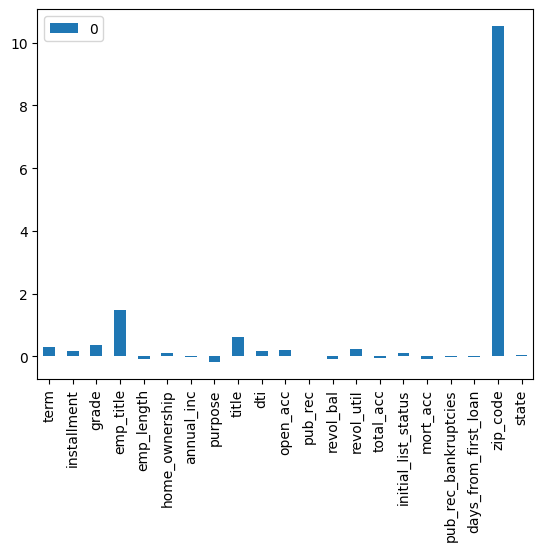

In [412]:
pd.DataFrame(data=LogReg.coef_,columns=col_names).T.plot(kind = "bar")

In [413]:
LogReg.intercept_

array([-0.85323162])

In [414]:
LogReg.predict(X_smote).shape

(382326,)

In [415]:
LogReg.predict(X_test).shape

(79206,)

### Hyper parameter tuning

In [417]:
LogReg = LogisticRegression(class_weight="balanced",solver = "newton-cholesky")
LogReg.fit(X_smote, y_smote)
print("smote Accuracy: ",accuracy_score(y_smote,LogReg.predict(X_smote)))
print("Test Accuracy: ",accuracy_score(y_test,LogReg.predict(X_test)))
print()
print("smote Negative Log Loss: ",log_loss(y_smote,LogReg.predict(X_smote)))
print("Test Negative Log Loss: ",log_loss(y_test,LogReg.predict(X_test)))
print()
print("smote f1_score: ",f1_score(y_smote,LogReg.predict(X_smote)))
print("Test f1_score: ",f1_score(y_test,LogReg.predict(X_test)))
print()
print("smote recall_score: ",recall_score(y_smote,LogReg.predict(X_smote)))
print("Test recall_score: ",recall_score(y_test,LogReg.predict(X_test)))
print()
print("smote precision_score: ",precision_score(y_smote,LogReg.predict(X_smote)))
print("Test precision_score: ",precision_score(y_test,LogReg.predict(X_test)))
print()
print("smote roc_auc_score: ",roc_auc_score(y_smote,LogReg.predict(X_smote)))
print("Test roc_auc_score: ",roc_auc_score(y_test,LogReg.predict(X_test)))
print()
print("smote matthews_corrcoef: ",matthews_corrcoef(y_smote,LogReg.predict(X_smote)))
print("Test matthews_corrcoef: ",matthews_corrcoef(y_test,LogReg.predict(X_test)))

smote Accuracy:  0.8951523045777687
Test Accuracy:  0.8931772845491504

smote Negative Log Loss:  3.7790939924466307
Test Negative Log Loss:  3.850280929794715

smote f1_score:  0.8949368614726557
Test f1_score:  0.7650701096765237

smote recall_score:  0.8931016985504517
Test recall_score:  0.8803194888178913

smote precision_score:  0.8967795817816041
Test precision_score:  0.6765038055487356

smote roc_auc_score:  0.8951523045777688
Test roc_auc_score:  0.8883314355160008

smote matthews_corrcoef:  0.7903112556775622
Test matthews_corrcoef:  0.707596642128738


> Not much difference has observed between lbfgs solver  and newton cholesky solver.

In [419]:
LogReg = LogisticRegression(class_weight="balanced",penalty="l1",solver = "saga")
LogReg.fit(X_smote, y_smote)
print("smote Accuracy: ",accuracy_score(y_smote,LogReg.predict(X_smote)))
print("Test Accuracy: ",accuracy_score(y_test,LogReg.predict(X_test)))
print()
print("smote Negative Log Loss: ",log_loss(y_smote,LogReg.predict(X_smote)))
print("Test Negative Log Loss: ",log_loss(y_test,LogReg.predict(X_test)))
print()
print("smote f1_score: ",f1_score(y_smote,LogReg.predict(X_smote)))
print("Test f1_score: ",f1_score(y_test,LogReg.predict(X_test)))
print()
print("smote recall_score: ",recall_score(y_smote,LogReg.predict(X_smote)))
print("Test recall_score: ",recall_score(y_test,LogReg.predict(X_test)))
print()
print("smote precision_score: ",precision_score(y_smote,LogReg.predict(X_smote)))
print("Test precision_score: ",precision_score(y_test,LogReg.predict(X_test)))
print()
print("smote roc_auc_score: ",roc_auc_score(y_smote,LogReg.predict(X_smote)))
print("Test roc_auc_score: ",roc_auc_score(y_test,LogReg.predict(X_test)))
print()
print("smote matthews_corrcoef: ",matthews_corrcoef(y_smote,LogReg.predict(X_smote)))
print("Test matthews_corrcoef: ",matthews_corrcoef(y_test,LogReg.predict(X_test)))

smote Accuracy:  0.8951706135601555
Test Accuracy:  0.8931015327121683

smote Negative Log Loss:  3.7784340698315733
Test Negative Log Loss:  3.853011302750485

smote f1_score:  0.8949499768034953
Test f1_score:  0.7649035124253784

smote recall_score:  0.8930703117235029
Test recall_score:  0.8801277955271566

smote precision_score:  0.8968375709182601
Test precision_score:  0.6763564939847778

smote roc_auc_score:  0.8951706135601554
Test roc_auc_score:  0.8882119876370757

smote matthews_corrcoef:  0.7903482000262095
Test matthews_corrcoef:  0.707378990632344


> Not much difference in saga solver with l1 regularisation also. lets stick to lbfgs

In [420]:
smote_scores = []
val_scores = []
for la in np.arange(0.01, 5000.0, 100): # range of values of Lambda
  model = LogisticRegression(C=1/la,class_weight="balanced")
  model.fit(X_smote, y_smote)
  smote_score = accuracy_score(y_smote, model.predict(X_smote))
  val_score = accuracy_score(y_val, model.predict(X_val))
  smote_scores.append(smote_score)
  val_scores.append(val_score)

In [421]:
len(val_scores)

50

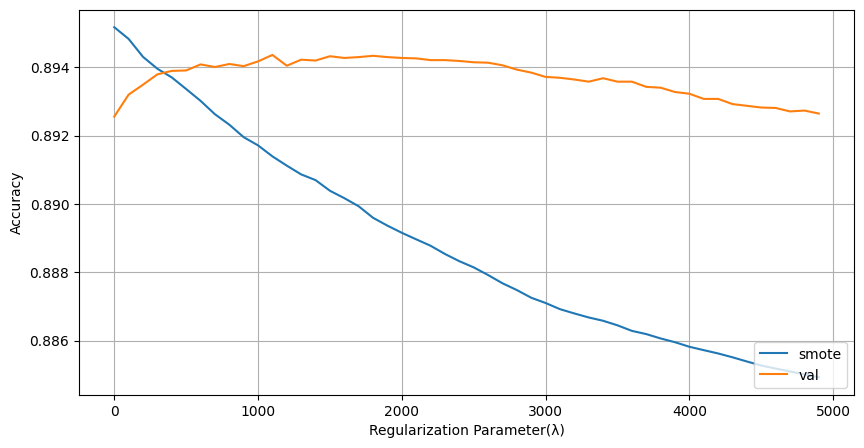

In [422]:
plt.figure(figsize=(10,5))
plt.plot(list(np.arange(0.01, 5000.0, 100)), smote_scores, label="smote")
plt.plot(list(np.arange(0.01, 5000.0, 100)), val_scores, label="val")
plt.legend(loc='lower right')
plt.xlabel("Regularization Parameter(λ)")
plt.ylabel("Accuracy")
plt.grid()
plt.show()

In [423]:
max(val_scores)

0.8943640633285357

In [424]:
j = 0
for i in val_scores:
    if i == max(val_scores):
        break
    j += 100
print("lambda for max val_score is",j)


lambda for max val_score is 1100


In [460]:
LogReg = LogisticRegression(class_weight="balanced",C = 1/1100)
LogReg.fit(X_smote, y_smote)
print("smote Accuracy: ",accuracy_score(y_smote,LogReg.predict(X_smote)))
print("Test Accuracy: ",accuracy_score(y_test,LogReg.predict(X_test)))
print()
print("smote Negative Log Loss: ",log_loss(y_smote,LogReg.predict(X_smote)))
print("Test Negative Log Loss: ",log_loss(y_test,LogReg.predict(X_test)))
print()
print("smote f1_score: ",f1_score(y_smote,LogReg.predict(X_smote)))
print("Test f1_score: ",f1_score(y_test,LogReg.predict(X_test)))
print()
print("smote recall_score: ",recall_score(y_smote,LogReg.predict(X_smote)))
print("Test recall_score: ",recall_score(y_test,LogReg.predict(X_test)))
print()
print("smote precision_score: ",precision_score(y_smote,LogReg.predict(X_smote)))
print("Test precision_score: ",precision_score(y_test,LogReg.predict(X_test)))
print()
print("smote roc_auc_score: ",roc_auc_score(y_smote,LogReg.predict(X_smote)))
print("Test roc_auc_score: ",roc_auc_score(y_test,LogReg.predict(X_test)))
print()
print("smote matthews_corrcoef: ",matthews_corrcoef(y_smote,LogReg.predict(X_smote)))
print("Test matthews_corrcoef: ",matthews_corrcoef(y_test,LogReg.predict(X_test)))

smote Accuracy:  0.8913937320506583
Test Accuracy:  0.8946291947579729

smote Negative Log Loss:  3.9145666778516546
Test Negative Log Loss:  3.7979487814757937

smote f1_score:  0.8900836225312294
Test f1_score:  0.7647821430584522

smote recall_score:  0.8794745845168783
Test recall_score:  0.8669648562300319

smote precision_score:  0.9009517378862416
Test precision_score:  0.6841468334005647

smote roc_auc_score:  0.8913937320506584
Test roc_auc_score:  0.8842030524463145

smote matthews_corrcoef:  0.7830099740289055
Test matthews_corrcoef:  0.7062278579469465


# CHAPTER 4: RESULTS EVALUATION

In [461]:
print('LogReg Accuracy:',LogReg.score(X_test,y_test))

LogReg Accuracy: 0.8946291947579729


In [462]:
y_test.value_counts()

0    63556
1    15650
Name: loan_status, dtype: int64

In [463]:
# Dumb model accuracy
63556/(63556+15650)

0.8024139585384945

> Accuracy better than dumb model

### Precision score

In [464]:
precision_score(y_test, y_pred)

0.684745240905126

### Recall score or sensitivity

In [465]:
recall_score(y_test, y_pred)

0.8527156549520767

> Precision score is lesser than Recall score

### f1 score

In [466]:
print(f'f1Score:{f1_score(y_test,y_pred)}')

f1Score:0.7595549104983067


> f1 score is Harmonic mean of Precision and Recall (equal importance to both of them)

### f_beta score

In [467]:
print(f'f2Score (Recall important):{fbeta_score(y_test,y_pred,beta = 2)}')
print(f'f0.5Score (Precision important):{fbeta_score(y_test,y_pred,beta = 0.5)}')

f2Score (Recall important):0.8128372863599265
f0.5Score (Precision important):0.7128282375061429


> f2 score is slightly giving importance to Recall

> f0.5 score is slightly giving importance to Precision

## ROC AUC CURVE & COMMENTS

In [468]:
probability = LogReg.predict_proba(X_test)
probability

array([[9.92347537e-01, 7.65246289e-03],
       [8.83925534e-01, 1.16074466e-01],
       [9.92304709e-01, 7.69529135e-03],
       ...,
       [9.87666032e-01, 1.23339685e-02],
       [6.00987929e-01, 3.99012071e-01],
       [3.14383841e-04, 9.99685616e-01]])

In [469]:
probabilites = probability[:,1]

In [470]:
fpr, tpr, thr = roc_curve(y_test,probabilites)

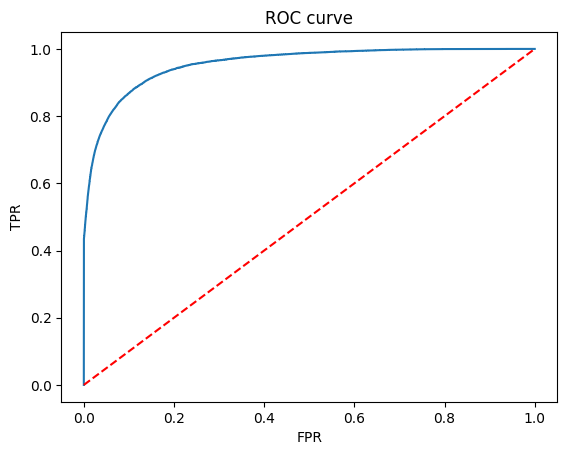

In [471]:
plt.plot(fpr,tpr)

#random model
plt.plot(fpr,fpr,'--',color='red' )
plt.title('ROC curve')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.show()

In [472]:
roc_auc_score(y_test,probabilites)

0.9559115223685404

> as Data is imbalanced, AU-ROC is not prefered

> Instead F1 score and Precision Recall curve works well with imbalanced data 

## PRECISION RECALL CURVE & COMMENTS

In [473]:
precision, recall, thr = precision_recall_curve(y_test, probabilites)

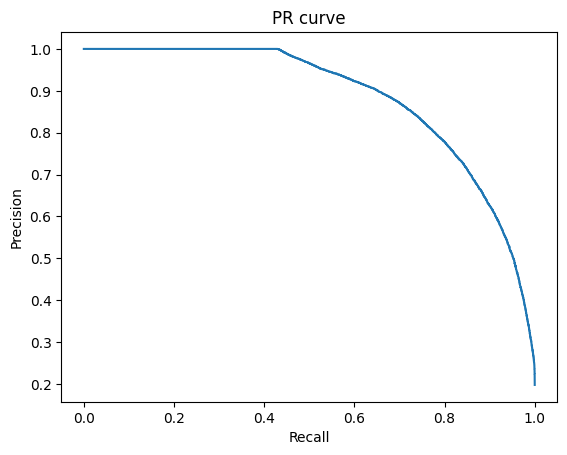

In [474]:
plt.plot(recall, precision)

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PR curve')
plt.show()

In [475]:
auc(recall, precision)

0.8849329232576484

In [476]:
print(f'f1Score:{f1_score(y_test,y_pred)}')

f1Score:0.7595549104983067


> Now AU-PRC comes little closer to F1 Score. Showing that PRC worked just fine in Imbalanced data

## CLASSIFICATION REPORT (CONFUSION MATIRX)

In [477]:
y_pred = LogReg.predict(X_test)

conf_matrix = confusion_matrix(y_test, y_pred)
conf_matrix # 2D np array

array([[57292,  6264],
       [ 2082, 13568]], dtype=int64)

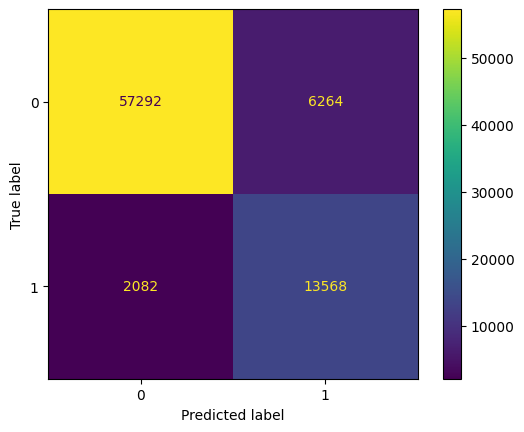

In [478]:
ConfusionMatrixDisplay(conf_matrix).plot()

In [479]:
# accuracy using confusion matrix
np.diag(conf_matrix).sum() / conf_matrix.sum()

0.8946291947579729

In [480]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.96      0.90      0.93     63556
           1       0.68      0.87      0.76     15650

    accuracy                           0.89     79206
   macro avg       0.82      0.88      0.85     79206
weighted avg       0.91      0.89      0.90     79206



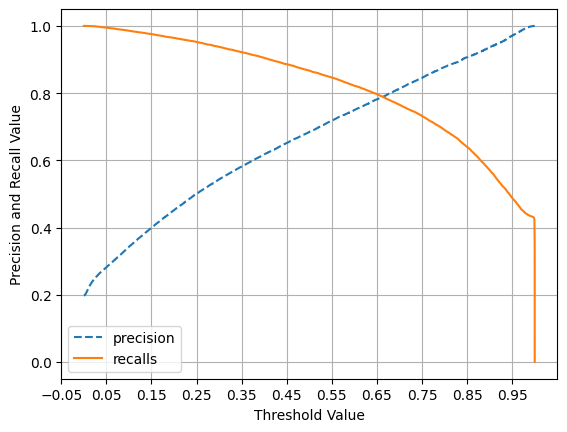

In [482]:
precisions, recalls, thresholds = precision_recall_curve(y_test,LogReg.predict_proba(X_test)[:,1])

threshold_boundary = thresholds.shape[0]
#plot precision
plt.plot(thresholds,precisions[0:threshold_boundary],linestyle='--',label='precision')
#plot recall
plt.plot(thresholds,recalls[0:threshold_boundary],label='recalls')

start,end=plt.xlim()
plt.xticks(np.round(np.arange(start,end,0.1),2))

plt.xlabel('Threshold Value')
plt.ylabel('Precision and Recall Value')
plt.legend()
plt.grid()
plt.show()

In [489]:
for i in range(len(thresholds)):
    if precisions[i] == recalls[i]:
        print(f"Threshold value at which Precision and recall curves intersected is {thresholds[i]}")

Threshold value at which Precision and recall curves intersected is 0.6631027545288799


In [490]:
best_threshold = 0.6631027545288799 # Replace with your best threshold value
y_pred = (LogReg.predict_proba(X_test)[:, 1] >= best_threshold).astype(int)

In [496]:
print("Test Accuracy: ",accuracy_score(y_test,y_pred))
print()
print("Test Negative Log Loss: ",log_loss(y_test,y_pred))
print()
print("Test f1_score: ",f1_score(y_test,y_pred))
print()
print("Test recall_score: ",recall_score(y_test,y_pred))
print()
print("Test precision_score: ",precision_score(y_test,y_pred))
print()
print("Test roc_auc_score: ",roc_auc_score(y_test,y_pred))
print()
print("Test matthews_corrcoef: ",matthews_corrcoef(y_test,y_pred))

Test Accuracy:  0.9165972274827665

Test Negative Log Loss:  3.0061406243025517

Test f1_score:  0.7889456869009585

Test recall_score:  0.7889456869009585

Test precision_score:  0.7889456869009585

Test roc_auc_score:  0.8684878853033333

Test matthews_corrcoef:  0.7369757706066669


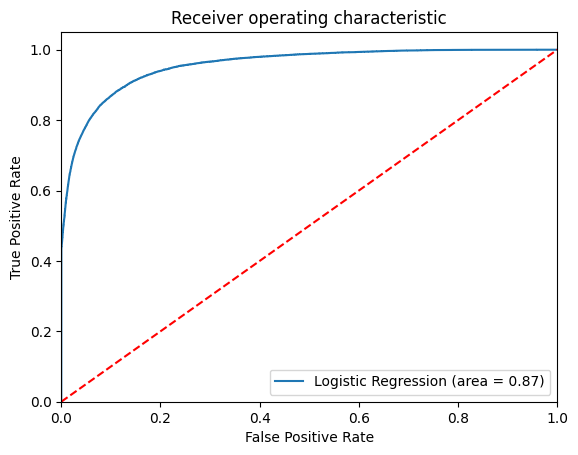

In [497]:
logit_roc_auc = roc_auc_score(y_test, y_pred)
fpr, tpr, thresholds = roc_curve(y_test, LogReg.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

In [498]:
from sklearn.ensemble import RandomForestClassifier as RF
clf = RF()
clf.fit(X_smote,y_smote)


RandomForestClassifier()

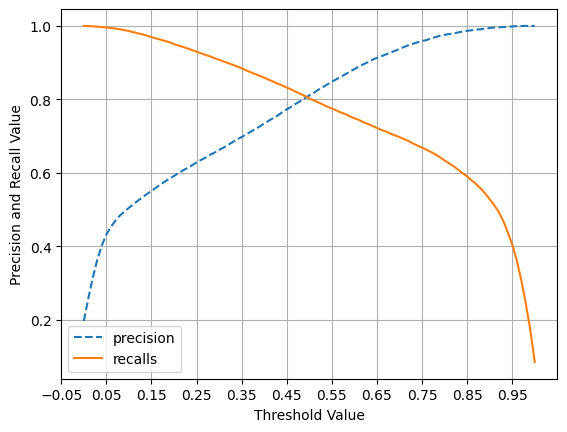

In [500]:
precisions, recalls, thresholds = precision_recall_curve(y_test,clf.predict_proba(X_test)[:,1])

threshold_boundary = thresholds.shape[0]
#plot precision
plt.plot(thresholds,precisions[0:threshold_boundary],linestyle='--',label='precision')
#plot recall
plt.plot(thresholds,recalls[0:threshold_boundary],label='recalls')

start,end=plt.xlim()
plt.xticks(np.round(np.arange(start,end,0.1),2))

plt.xlabel('Threshold Value')
plt.ylabel('Precision and Recall Value')
plt.legend()
plt.grid()
plt.show()

In [504]:
diff = []
for i in range(len(thresholds)):
    diff.append(abs(precisions[i]-recalls[i]))

print(min(diff))
#print(f"Threshold value at which Precision and recall curves intersected is {thresholds[i]}")

0.0064155987503986545


In [516]:
best_threshold = 0.49 # Replace with your best threshold value
y_pred = (clf.predict_proba(X_test)[:, 1] >= best_threshold).astype(int)
print("Test Accuracy: ",accuracy_score(y_test,y_pred))
print()
print("Test Negative Log Loss: ",log_loss(y_test,y_pred))
print()
print("Test f1_score: ",f1_score(y_test,y_pred))
print()
print("Test recall_score: ",recall_score(y_test,y_pred))
print()
print("Test precision_score: ",precision_score(y_test,y_pred))
print()
print("Test roc_auc_score: ",roc_auc_score(y_test,y_pred))
print()
print("Test matthews_corrcoef: ",matthews_corrcoef(y_test,y_pred))

Test Accuracy:  0.9232002626063682

Test Negative Log Loss:  2.768143114991284

Test f1_score:  0.8064280031821799

Test recall_score:  0.8096485623003195

Test precision_score:  0.8032329635499208

Test roc_auc_score:  0.8804048714956818

Test matthews_corrcoef:  0.7585357458618506


## TRADE OFF QUESTIONS

### 1. How can we make sure that our model can detect real defaulters and there are less false positives? This is important as we can lose out on an opportunity to finance more individuals and earn interest on it.

> Real Defaulters means True positives. So to give more importance to TP and Reduce False Positives. It is indicating that to improve the precision score. That means more weightage should be given for Precision score

> f beta score with Beta less than 1 should be selected. Beta can be taken as hyper parameter to find best Beta score. But On decrease of Beta, Recall score will decrease. We can take Specificity as metric, Where TN increases and FP decreases 

> If False Negatives increases, We lose out an oppurtunity to finance more individuals. SO to minimise the FN, We have use Recall or sensitivity or f Beta score with Beta greater than 1 or False Negative Rate

### 2. Since NPA (non-performing asset) is a real problem in this industry, it’s important we play safe and shouldn’t disburse loans to anyone.

> To play safe, False positive should be minimised. So we have to use F Beta score with Beta less than 1 or Specificity or Recall score as hyper parameter tuning metric

# CHAPTER 5: ACTIONABLE INSIGHTS & RECOMMENDATIONS

## Actionable Insights

> 396030 data points , 26 features , 1 Target label.

> 80.38% belongs to the class 0 : which is loan fully paid.

> remaining % belongs to the class 1 : which were charged off.

> Loan Amount distribution / median is slightly higher for Charged_off loanStatus.

> Interest Rate mean and median is higher for Charged_off LoanStatus.

> Probability of Charged_off LoanStatus is higher for Loan Grades are E ,F, G.

> G grade has the highest probability of having defaulter.

> Similar pattern is visible in sub_grades probability plot.

> Loan Tap has customers with earliest cr year around 1950 to 2010. Most of the customers are started taking loans from 1990 to 2010.
 
> 36 months loans are significantly more than 60 months loans
 
> B Grade has higher amount loans, G Grade has least number. Grades indicates interest rates or risk in a way. 

>  Sub grade also mimics the grade behaviour. B3 grade has higher amount of loans, G5 has lower amount of loans.

> 10+ years emp length are prefering to take loans

> Most of home ownership occupied either mortage(trying to get home), Own or Rent. (Can negelect remaining categories)

> Teacher and manager have more loan applications

> debt_cosolidation and credit card is dominating purpose. 

> Almost all customers are Individual application type only 

> For those borrowers who have rental home, has higher probability of defaulters.

> borrowers having their home mortgage and owns have lower probability of defaulter.

> Annual income median is lightly higher for those who's loan status is as fully paid.

> Somehow , verified income borrowers probability of defaulter is higher than those who are not verified by loan tap.

> the probability of defaulters is higher in the small_business owner borrowers.

> debt-to-income ratio is higher for defaulters.

> number of open credit lines in the borrowers credit file is same as for loan status as fully paid and defaulters.

> Total credit revolving balance is almost same for both borrowers who had fully paid loan and declared defaulter but Revolving line utilization rate is higher for defaulter borrowers.

> columns like issue_d, earliest_cr_line, address are deleted before assumption check

> columns like int rate is deleted as subgrade and grade indicates int rate indirect manner.

> columns like verification status and application type are deleted due to OLS p_value

> columns like loan amount, sub-grade are having Higher VIF score. So deleted    

> Most important features/ data for prediction , as per Logistic Regression, Decision tree classifier and Random Forest model are : zipcode, emp_title, title, grade, revol_util, Open acc, term

> Balancing with Smote is required an it has improved the metrics slight manner only

> If we want probabilities of classes: Log loss

> If classes are balanced: Accuracy

> IF classes are imbalanced:
1. if we are more concerned about False positive and true positive, then we use precision.
2. If we are more concerned about False Negatives and True positive then we use recall.
3. F1 score is a balance between precision and recall.
4. If our concern is both classes (true negative and true positive) then we use ROC_AUC

> If severe imbalance : PR AUC

> F beta score can be used to shift the importance towards Precision or Recall with Beta value

```
Final Results given by Logistic Regresion with Best threshold = 0.66, best lambda = 1/1100, class weight = balanced are
Test Accuracy:  0.9165972274827665

Test Negative Log Loss:  3.0061406243025517

Test f1_score:  0.7889456869009585

Test recall_score:  0.7889456869009585

Test precision_score:  0.7889456869009585

Test roc_auc_score:  0.8684878853033333

Test matthews_corrcoef:  0.7369757706066669 
```

> Ensemble methods definitely provide more better model than Simple Logistic regression  

```
Final Results given by Random Forest classifier is with  best threshold = 0.49 are

Test Accuracy:  0.9232002626063682

Test Negative Log Loss:  2.768143114991284

Test f1_score:  0.8064280031821799

Test recall_score:  0.8096485623003195

Test precision_score:  0.8032329635499208

Test roc_auc_score:  0.8804048714956818

Test matthews_corrcoef:  0.7585357458618506
```
  


### Questionnaire

Question and Answers

> What percentage of customers have fully paid their Loan Amount? = 80.38%

> correlation between Loan Amount and Installment features --> has 0.97 spearman correlation and 0.95 pearson correlation. So Both are highly correlated as installment can be calculated by using the formulae. EMI = [P x R x (1+R)^N]/[(1+R)^N-1].  So they are multi collinear. 

>The majority of people have home ownership as Mortagage Home owner ship. Second Majority is Rent.

>People with grades ‘A’ are more likely to fully pay their loan --> False. Actually B has higher probability to fully pay their loan

>Name the top 2 afforded job titles --> Teacher and Manager are having more applictions as well as they are paying fully too

> If Banks Strictly donot want to disburse loans to real defaulters, So we have to Decrease the False Negatives, So Recall should be higher. (Most of the times it is preferred)

> If Banks Strictly donot want to loose the good customers, We have to decrease the False positives , So Precision should be higher

> F1 score is Harmonic mean of Precision and recall. (To balance both of them, F1 score can be utilised)

> ROC-AUC should be utilised when we need to increase True Negatives and True Positives

> PR-AUC should be used for severe Imbalance data

>F Beta score with Beta > 1 gives importance to Recall and Beta < 0.5 gives importance to Precision

>Gap between the Precision and recall effects in two ways. Either Bank looses good customer or gets Bad customer. We can hyper parameter tune that gap by using Threshold concept

> zipcode, emp_title, title, grade, revol_util, Open acc, term features are heavily effecting the outcome

> Geographical parameter like state and zip code has weights. so they effect the outcome


## Recommendations:

> Should improve Verification procedure as Verification status has no effect on model

> can provide Easy Loans for Teacher, managers and Mortgage home owners

> B grade and C grade interest rates should be preferred to customers

> Joint and Direct application should be improved. So Better int rate can be provided for them

> F Beta score is better metric to balance the importance between Precision and Recall. Beta can hyper tuned

> customer with Higher annual income and lower dti, lower revol util, lower revol bal, more mort acc, no pub_rec, no pub_rec_bankruptcies should be given more preference to disburse the loans